<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Préparation" data-toc-modified-id="Préparation-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Préparation</a></span><ul class="toc-item"><li><span><a href="#Librairies-utilisées" data-toc-modified-id="Librairies-utilisées-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Librairies utilisées</a></span></li><li><span><a href="#Imports" data-toc-modified-id="Imports-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Fonctions-utilisées" data-toc-modified-id="Fonctions-utilisées-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Fonctions utilisées</a></span></li><li><span><a href="#Préparation-des-jeux-de-données" data-toc-modified-id="Préparation-des-jeux-de-données-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Préparation des jeux de données</a></span></li></ul></li><li><span><a href="#Premiers-tests" data-toc-modified-id="Premiers-tests-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Premiers tests</a></span><ul class="toc-item"><li><span><a href="#Base" data-toc-modified-id="Base-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Base</a></span></li><li><span><a href="#Transformation-log" data-toc-modified-id="Transformation-log-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Transformation log</a></span></li><li><span><a href="#Feature-Scaling" data-toc-modified-id="Feature-Scaling-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Feature Scaling</a></span></li><li><span><a href="#Nombre-de-variables" data-toc-modified-id="Nombre-de-variables-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Nombre de variables</a></span></li><li><span><a href="#Méthode" data-toc-modified-id="Méthode-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Méthode</a></span></li><li><span><a href="#Complexité-des-variables" data-toc-modified-id="Complexité-des-variables-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Complexité des variables</a></span></li><li><span><a href="#Stabilité-du-K-Means" data-toc-modified-id="Stabilité-du-K-Means-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>Stabilité du K-Means</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-2.8"><span class="toc-item-num">2.8&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></li><li><span><a href="#Segmentations" data-toc-modified-id="Segmentations-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Segmentations</a></span><ul class="toc-item"><li><span><a href="#RFM" data-toc-modified-id="RFM-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>RFM</a></span></li><li><span><a href="#RFM-+" data-toc-modified-id="RFM-+-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>RFM +</a></span></li><li><span><a href="#Douleurs-clients" data-toc-modified-id="Douleurs-clients-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Douleurs clients</a></span></li><li><span><a href="#Type-d'achat" data-toc-modified-id="Type-d'achat-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Type d'achat</a></span></li><li><span><a href="#Type-de-produits" data-toc-modified-id="Type-de-produits-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Type de produits</a></span></li></ul></li><li><span><a href="#Exports" data-toc-modified-id="Exports-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Exports</a></span></li></ul></div>

# Préparation
Notebook formaté avec autopep8
## Librairies utilisées

In [1]:
# builtin
import datetime
import sys
from datetime import date
from datetime import datetime
import math
from statistics import mode

# data
import numpy as np
import pandas as pd

# visualisation
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# metrics
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster.elbow import kelbow_visualizer
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn import metrics
from sklearn import cluster
from yellowbrick.cluster import InterclusterDistance

# preprocessing
from sklearn import preprocessing
from sklearn import decomposition
from sklearn.preprocessing import OneHotEncoder

# outils
from tools import *

print('Matplotlib Version: ' + mpl.__version__)
print('NumPy Version: ' + np.version.full_version)
print('Python Version: ' + sys.version)
print('Pandas Version: ' + pd.__version__)
print('Numpy version: ' + np.__version__)
print('Seaborn version: ' + sns.__version__)

now = datetime.now().isoformat()
print('Lancé le ' + now)

Matplotlib Version: 3.5.2
NumPy Version: 1.21.5
Python Version: 3.9.13 (main, Aug 25 2022, 18:29:29) 
[Clang 12.0.0 ]
Pandas Version: 1.4.4
Numpy version: 1.21.5
Seaborn version: 0.11.2
Lancé le 2022-11-30T11:06:43.391770


Matplotlib Version: 3.5.2  
NumPy Version: 1.21.5  
Python Version: 3.9.13 (main, Aug 25 2022, 18:29:29)   
[Clang 12.0.0 ]  
Pandas Version: 1.4.4  
Numpy version: 1.21.5  
Seaborn version: 0.11.2  
Lancé le 2022-11-25T15:21:24.335485  

## Imports

In [2]:
complete = pd.read_csv('./data/inter/order_complete_log.csv')
complete_no_log = pd.read_csv('./data/inter/order_complete.csv')

In [3]:
display(complete.head(2))
display(complete_no_log.head(2))

,customer_unique_id,frequence,order_approved_at,order_unavailable,order_canceled,delivery_delay_mean,delivery_delay_last,product_category_general_art_and_culture,product_category_general_auto,product_category_general_beauty,...,payment_type_voucher,review_score_mean,review_message_lenght,distance_customer_seller,customer_lat,customer_lng,recence,delivery_time,validation_time,delivery_delay
0,0000366f3b9a7992bf8c76cfdf3221e2,1,2018-05-10 11:11:18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,5.0,111.0,84.728053,-23.340235,-46.830140,252.462674,6.411227,0.221142,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,2018-05-07 18:25:44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,4.0,0.0,7.642004,-23.559115,-46.787626,249.764363,3.285590,2.108764,0.0


,customer_unique_id,frequence,order_approved_at,order_unavailable,order_canceled,delivery_delay_mean,delivery_delay_last,product_category_general_art_and_culture,product_category_general_auto,product_category_general_beauty,...,review_score_mean,review_message_lenght,distance_customer_seller,customer_lat,customer_lng,recence,delivery_time,validation_time,delivery_delay,canceled
0,0000366f3b9a7992bf8c76cfdf3221e2,1,2018-05-10 11:11:18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,111.0,84.728053,-23.340235,-46.830140,252.462674,6.411227,0.247500,0.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,2018-05-07 18:25:44,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,4.0,0.0,7.642004,-23.559115,-46.787626,249.764363,3.285590,7.238056,0.0,0.0


## Fonctions utilisées

In [4]:
def cls_viz(X, k):
    '''
    Pour visualiser les silhouettes et distances inter-cluster pour k clusters, model k-means
    --- Entrées ---
    X : DataFrame des variables d'entrée, numériques, normées
    k : nombre de clusters
    --- Sorties ---
    graphique 1 : silhouette plot
    graphique 2 : intercluster distance map
    '''
    model = KMeans(k)

    fig = plt.figure(figsize=(6, 4))
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
    visualizer.fit(X)
    visualizer.show()
    print(f"Silhouette score : {round(visualizer.silhouette_score_,3)}")

    fig = plt.figure(figsize=(6, 4))
    visualizer = InterclusterDistance(model)
    visualizer.fit(X)
    visualizer.show()

In [5]:
def km(X, kmin, kmax, random_state=None):
    '''
    --- Entrées ---
    X : Dataframe des variables d'entrée, sera centré-réduit
    kmin : k minimum pour l'entrainement d'un k-means
    k-max : k maximum pour l'entrainement d'un k-means
    --- Sorties ---
    Affichage de 3 KElbowVisualizer, pour 3 tests de k effectués
    k_optimal : mode des k des 3 tests effectués 
    '''
    std_scale = preprocessing.StandardScaler().fit(X)
    X_scaled = std_scale.transform(X)
    model = KMeans(random_state)

    visualizer = KElbowVisualizer(model, k=(kmin, kmax))
    visualizer.fit(X_scaled)
    visualizer.show()
    kopti1 = visualizer.elbow_value_

    visualizer = KElbowVisualizer(
        model, k=(kmin, kmax), metric='calinski_harabasz')
    visualizer.fit(X_scaled)
    visualizer.show()
    kopti2 = visualizer.elbow_value_

    visualizer = KElbowVisualizer(
        model, k=(kmin, kmax), metric='silhouette')
    visualizer.fit(X_scaled)
    visualizer.show()
    kopti3 = visualizer.elbow_value_

    if (kopti1 is None):
        print('Pas de valeur de k optimale avec la metrics Distortion')
    else:
        cls_viz(X_scaled, kopti1)
    if (kopti1 != kopti2) & (kopti2 is not None):
        cls_viz(X_scaled, kopti2)
    if (kopti3 != kopti2) & (kopti3 != kopti1):
        cls_viz(X_scaled, kopti3)

    return mode([kopti1, kopti2, kopti3])

In [6]:
# choix du scaler

def standard(X):
    '''
    Applique StandardScaler sur les données d'entrées
    --- Entrées ---
    X : DataFrame à centrer/réduire
    --- Sorties ---
    X_scaled : données centrées-réduites
    '''
    std_scale = preprocessing.StandardScaler().fit(X)
    X_scaled = std_scale.transform(X)

    return X_scaled


def minmax(X):
    '''
    Applique MinMaxScaler sur les données d'entrées
    --- Entrées ---
    X : DataFrame à traiter
    --- Sorties ---
    X_scaled : données traitées
    '''
    std_scale = preprocessing.MinMaxScaler().fit(X)
    X_scaled = std_scale.transform(X)

    return X_scaled


def robust(X):
    '''
    Applique RobustScaler sur les données d'entrées
    --- Entrées ---
    X : DataFrame à traiter
    --- Sorties ---
    X_scaled : données traitées
    '''
    std_scale = preprocessing.RobustScaler().fit(X)
    X_scaled = std_scale.transform(X)

    return X_scaled

In [7]:
def clust(X, k, scale='standard'):
    '''
    --- Entrées ---
    X : DataFrame d'entrée, sera centré-réduit
    k : nombre de clusters pour le k-means
    scale : 'standard' pour StandardScaler, 'minmax' pour MinMaxScaler, 'robust' pour RobustScaler, 'aucun' pour ne pas appliquer de scaler
    --- Sorties ---
    Affichage pour chaque cluster d'un radar avec la valeur du centroïde pour chaque variable
    X_cls : DataFrame d'entrée avec ajout d'une variable 'cluster' indiquant le cluster auquel l'individu appartient
    X_cls_centers : Dataframe avec les clusters en individus et les valeurs des centres des clusters pour chaque feature
    '''

    # choix du scaler
    if scale == 'aucun':
        X_scaled = X
    elif scale == 'minmax':
        std_scale = preprocessing.MinMaxScaler().fit(X)
        X_scaled = std_scale.transform(X)
    elif scale == 'robust':
        std_scale = preprocessing.RobustScaler().fit(X)
        X_scaled = std_scale.transform(X)
    else:
        std_scale = preprocessing.StandardScaler().fit(X)
        X_scaled = std_scale.transform(X)

    cls = cluster.KMeans(n_clusters=k, n_init=8, random_state=42)
    cls.fit(X_scaled)

    # récupération des clusters et de leurs centres
    X_cls = X.copy()
    X_cls['cluster'] = cls.labels_
    X_cls_centers = pd.DataFrame(cls.cluster_centers_)
    if scale != 'aucun':
        X_cls_centers = pd.DataFrame(
            std_scale.inverse_transform(X_cls_centers))

    # réduction des valeurs entre 0 et 1
    for i, j in X_cls_centers.iteritems():
        if max(X_cls_centers[i]) == 0:
            X_cls_centers[i] = 0
        else:
            X_cls_centers[i] = X_cls_centers[i]/max(X_cls_centers[i])

    var = X_cls_centers.shape[1]
    if X_cls_centers.shape[0] < 7:
        fig = plt.figure(figsize=(8, 5))
    elif X_cls_centers.shape[0] > 9:
        fig = plt.figure(figsize=(14, 5))
    else:
        fig = plt.figure(figsize=(8, 10))
    colors = ["#007FFF", '#FCDC12', '#DF73FF', '#54F98D', '#FF0000',
              '#19FF00', '#FF00EE', '#00FF37', '#FF009D', '#00FF87',
              '#FF004C', '#00FFD8']
    angle = np.arange(0, np.pi*2, np.pi*2/var)
    width = np.pi*2/var
    ca_total = complete_no_log['price_total_sum'].sum()

    for i in range(0, k, 1):
        heights = X_cls_centers.iloc[i, :]
        ax = plt.subplot(math.ceil(k/3), 3, i+1, projection='polar')
        plt.bar(x=angle, height=heights, width=width, alpha=0.5, color=colors)
        ax.set_ylim(0, 1)
        nbr = round(X_cls[X_cls['cluster'] == i].shape[0] /
                    X_cls.shape[0]*100, 1)
        ca = round(complete_no_log.loc[X_cls['cluster']
                   == i, 'price_total_sum'].sum()/ca_total*100, 1)
        ax.set_title(
            f"Cluster {i}\n{nbr}% des individus\n{ca}% du chiffre d'affaires", pad=20)
        ax.xaxis.set_ticks(angle+np.pi/var)
        ax.tick_params(labelbottom=False, labelleft=False)
        for a, h, lab in zip(angle, heights, X.columns):
            ax.text(x=a, y=1, s=lab, fontsize=10, ha='center')
    fig.tight_layout()
    plt.show()

    return X_cls, X_cls_centers

## Préparation des jeux de données

In [8]:
# Mise en index de la variable customer_unique_id
# et passage des dates en format date

complete_no_log.set_index('customer_unique_id', inplace=True)
complete.set_index('customer_unique_id', inplace=True)
complete['order_approved_at'] = pd.to_datetime(complete['order_approved_at'])
complete_no_log['order_approved_at'] = pd.to_datetime(
    complete_no_log['order_approved_at'])

In [9]:
complete_no_log.info()

<class 'pandas.core.frame.DataFrame'>
Index: 73627 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffff5962728ec6157033ef9805bacc48
Data columns (total 53 columns):
 #   Column                                           Non-Null Count  Dtype         
---  ------                                           --------------  -----         
 0   frequence                                        73627 non-null  int64         
 1   order_approved_at                                73627 non-null  datetime64[ns]
 2   order_unavailable                                73627 non-null  float64       
 3   order_canceled                                   73627 non-null  float64       
 4   delivery_delay_mean                              73627 non-null  float64       
 5   delivery_delay_last                              73627 non-null  float64       
 6   product_category_general_art_and_culture         73627 non-null  float64       
 7   product_category_general_auto                    73627 non-null  flo

In [10]:
# mise à part de la variable date
y = complete_no_log['order_approved_at']
complete_no_log.drop(columns='order_approved_at', inplace=True)
pd.set_option('display.max_columns', 60)


complete_no_log.head(2)

,frequence,order_unavailable,order_canceled,delivery_delay_mean,delivery_delay_last,product_category_general_art_and_culture,product_category_general_auto,product_category_general_beauty,product_category_general_business,product_category_general_children,product_category_general_fashion,product_category_general_food_drink,product_category_general_gifts,product_category_general_house,product_category_general_market_place,product_category_general_office,product_category_general_pet_shop,product_category_general_sport,product_category_general_technology,product_category_general_tools_and_construction,product_name_lenght_mean,product_description_lenght_mean,product_photos_qty_mean,price_mean,freight_value_max,product_weight_g_max,product_length_cm_max,product_height_cm_max,product_width_cm_max,freight_value_sum,product_weight_g_total_max,product_volume_total_max,item_count,price_total_sum,price_total_mean,payment_sequential,payment_installments,payment_value,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,review_score_mean,review_message_lenght,distance_customer_seller,customer_lat,customer_lng,recence,delivery_time,validation_time,delivery_delay,canceled
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0,236.0,1.0,129.9,12.00,1500.0,34.0,7.0,32.0,12.00,1500.0,0.007616,1,141.90,141.90,1,1.0,141.90,0.0,1.0,0.0,0.0,5.0,111.0,84.728053,-23.340235,-46.830140,252.462674,6.411227,0.247500,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,635.0,1.0,18.9,8.29,375.0,26.0,11.0,18.0,8.29,375.0,0.005148,1,27.19,27.19,1,0.0,27.19,0.0,1.0,0.0,0.0,4.0,0.0,7.642004,-23.559115,-46.787626,249.764363,3.285590,7.238056,0.0,0.0


In [11]:
# création des DataFrame qui serviront à la clusterisation

rfm_mean = []
rfm_mean = complete_no_log[['recence', 'frequence', 'price_total_mean']]

rfm_mean_log = []
rfm_mean_log = complete[['recence', 'frequence', 'price_total_mean']]

rfm_sum = []
rfm_sum = complete_no_log[['recence', 'frequence', 'price_total_sum']]

rfm_plus = rfm_mean.copy()
rfm_plus = pd.merge(rfm_plus, complete_no_log[[
    'payment_installments', 'payment_type_voucher']],
    left_index=True, right_index=True)

complete_no_log['canceled'] = complete_no_log['order_unavailable'] + \
    complete_no_log['order_canceled']
happy = complete_no_log[[
    'delivery_delay', 'review_score_mean', 'delivery_time',
    'review_message_lenght', 'canceled']]

achat = complete_no_log[[
    # 'product_volume_total_max', # variable retirée car perturbait la segmentation
    'distance_customer_seller', 'product_weight_g_total_max',
    'product_length_cm_max',
    'item_count', 'price_mean']]

product = complete_no_log.iloc[:, 6:21]
product.head(2)

,product_category_general_auto,product_category_general_beauty,product_category_general_business,product_category_general_children,product_category_general_fashion,product_category_general_food_drink,product_category_general_gifts,product_category_general_house,product_category_general_market_place,product_category_general_office,product_category_general_pet_shop,product_category_general_sport,product_category_general_technology,product_category_general_tools_and_construction,product_name_lenght_mean
customer_unique_id,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0
0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0


In [12]:
# creation d'un DataFrame RFM avec une variable simplifiée

rfm_simple = rfm_mean.copy()
rfm_simple['recence'] = np.where(
    rfm_simple['recence'] < 182, 0, rfm_simple['recence'])
rfm_simple['recence'] = np.where(
    rfm_simple['recence'] > 334, 3, rfm_simple['recence'])
rfm_simple['recence'] = np.where(
    rfm_simple['recence'] > 273, 2, rfm_simple['recence'])
rfm_simple['recence'] = np.where(
    rfm_simple['recence'] >= 182, 1, rfm_simple['recence'])
rfm_simple['recence'].unique()

array([1., 0., 2., 3.])

# Premiers tests

## Base
Nous prendrons comme base le jeu de données RFM_mean, avec un StandardScaler et un K-means, sans transformation log des données.

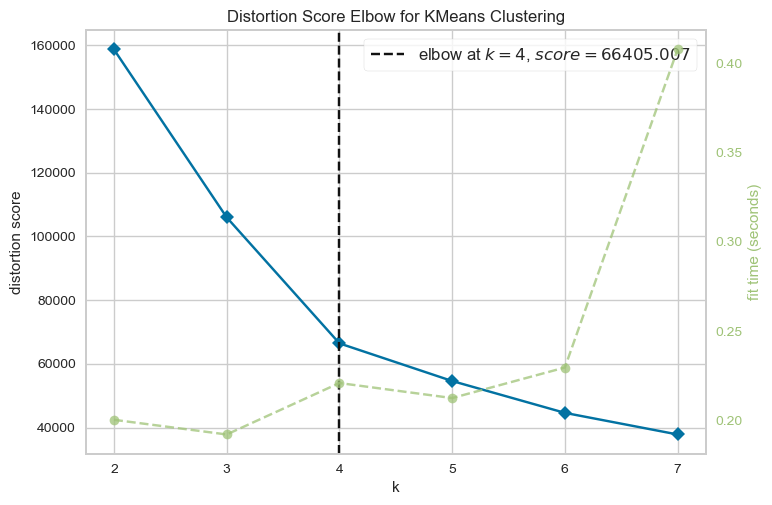

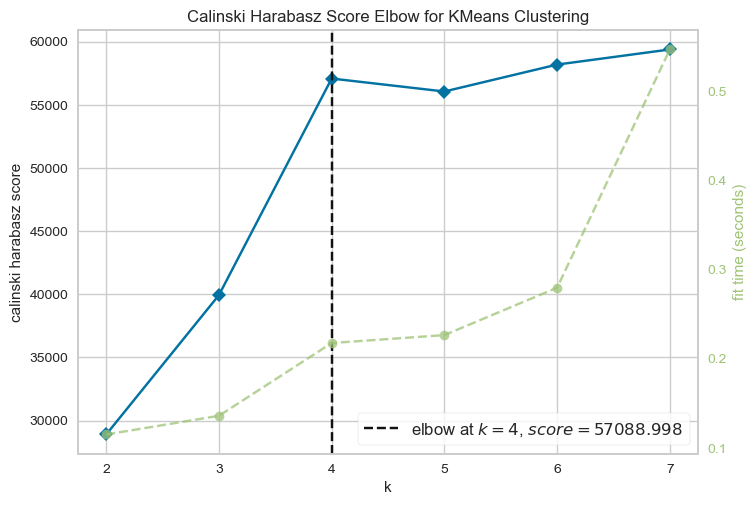

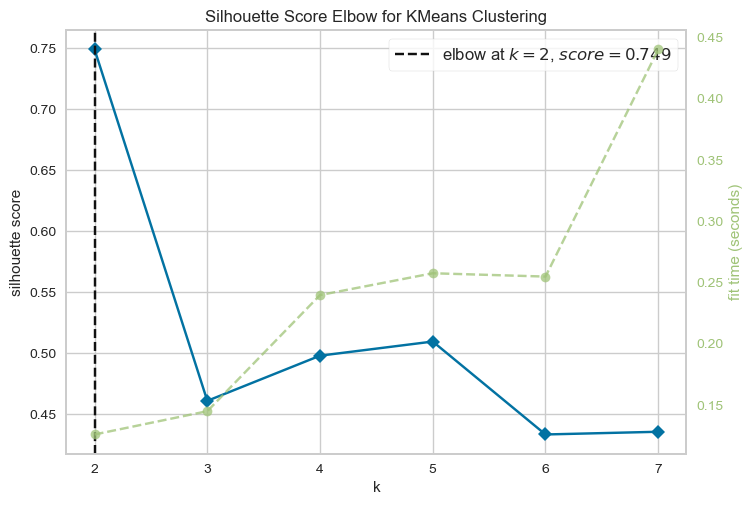

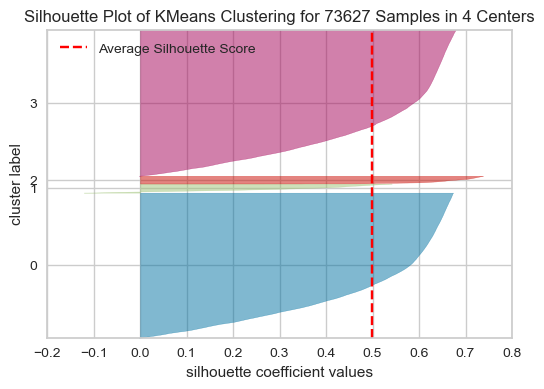

Silhouette score : 0.498


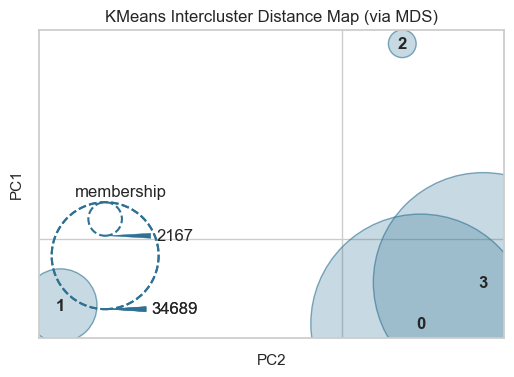

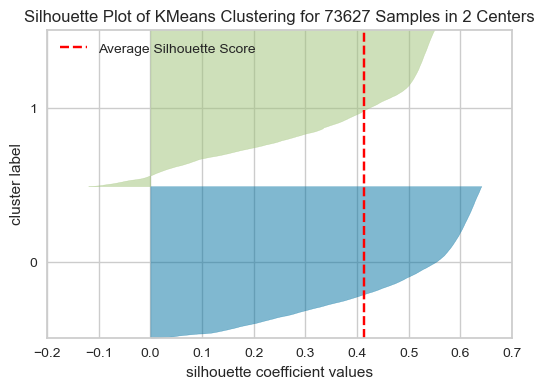

Silhouette score : 0.413


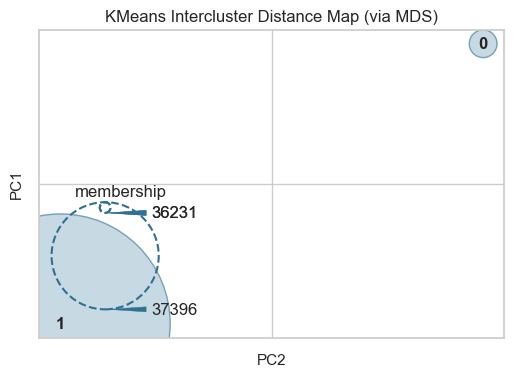

In [13]:
# jeu sans transformation log
k_base = km(rfm_mean, 2, 8)

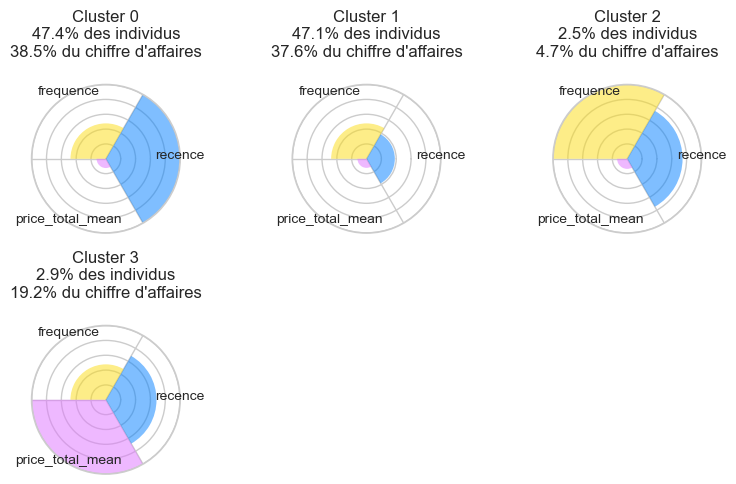

In [14]:
rfm_base_cls, rfm_base_cls_centers = clust(rfm_mean, 4)

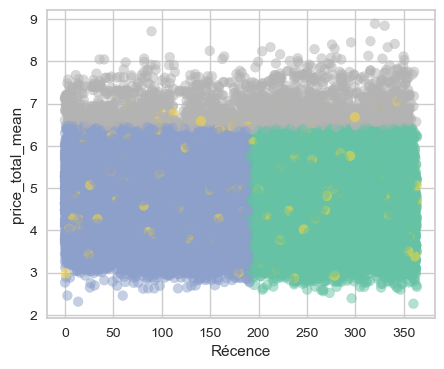

In [15]:
fig = plt.figure(figsize=(5, 4))

plt.scatter(x=rfm_base_cls['recence'], y=np.log(
    rfm_base_cls['price_total_mean']), c=rfm_base_cls['cluster'], cmap='Set2', alpha=0.5)
plt.xlabel('Récence')
plt.ylabel('price_total_mean')

plt.show()

## Transformation log
Nous utiliserons le jeu de données pour lequel les distribution dont le skewness était supérieur à 3 ont subi une transformation log.  
En l'occurrence, seule la variable price_total_mean est ici affectée. 

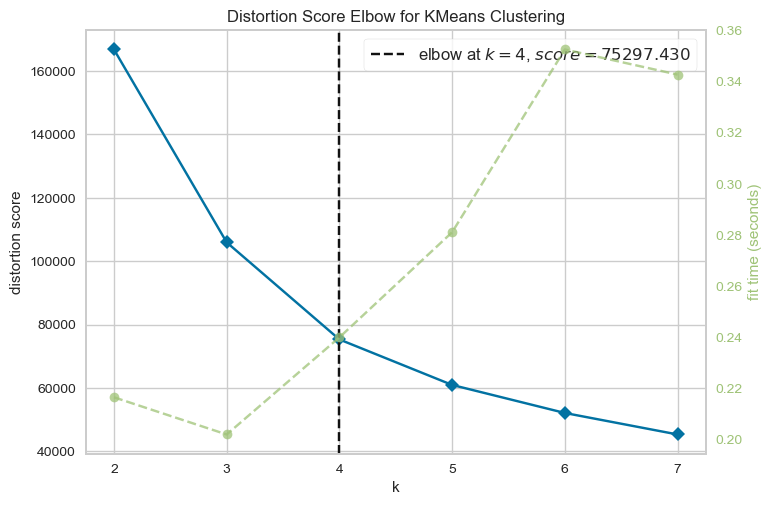

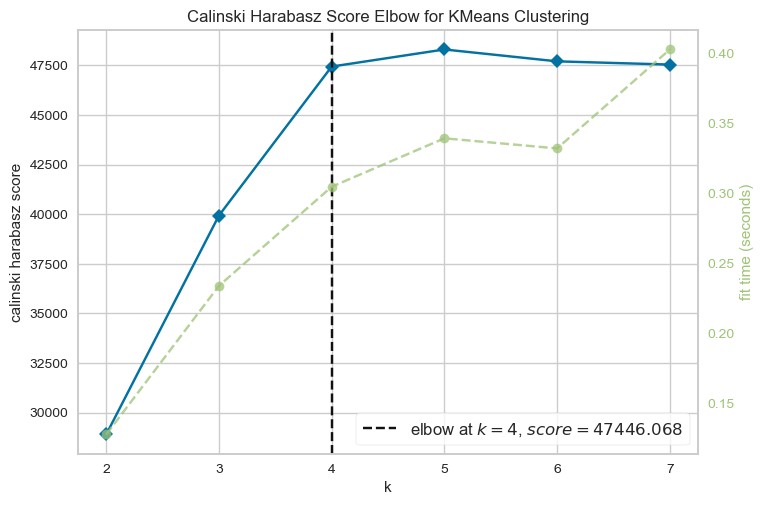

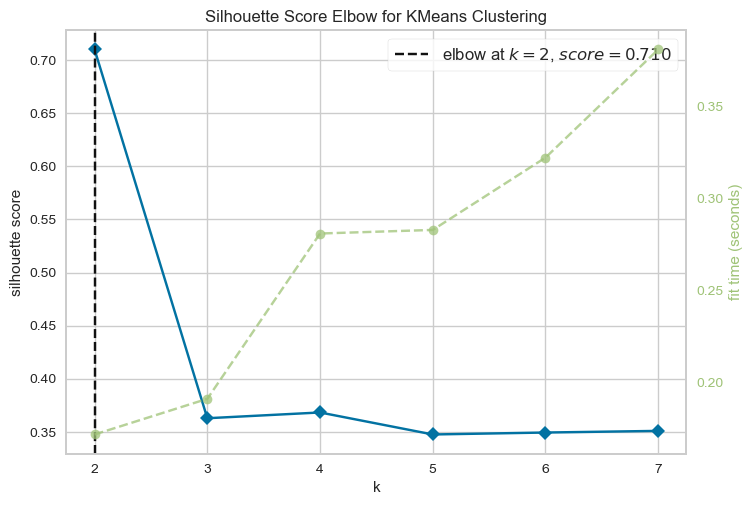

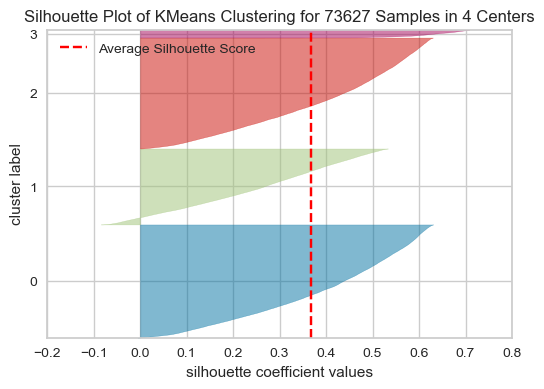

Silhouette score : 0.368


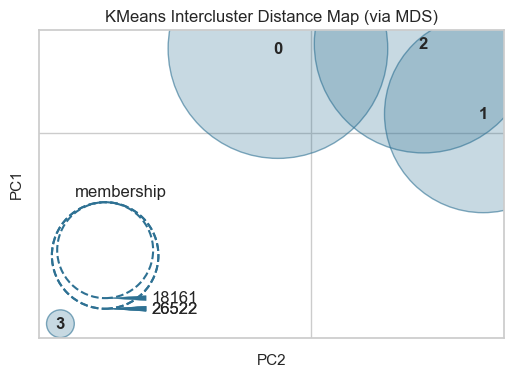

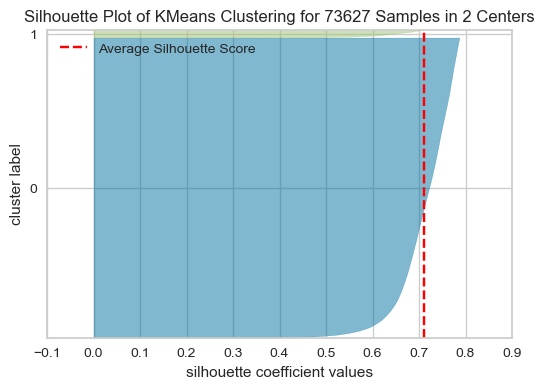

Silhouette score : 0.71


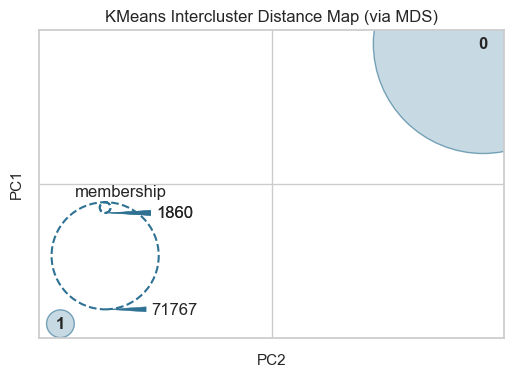

In [16]:
# jeu avec transformation x=log(x+1) pour la variable price_total_mean
k_log = km(rfm_mean_log, 2, 8)

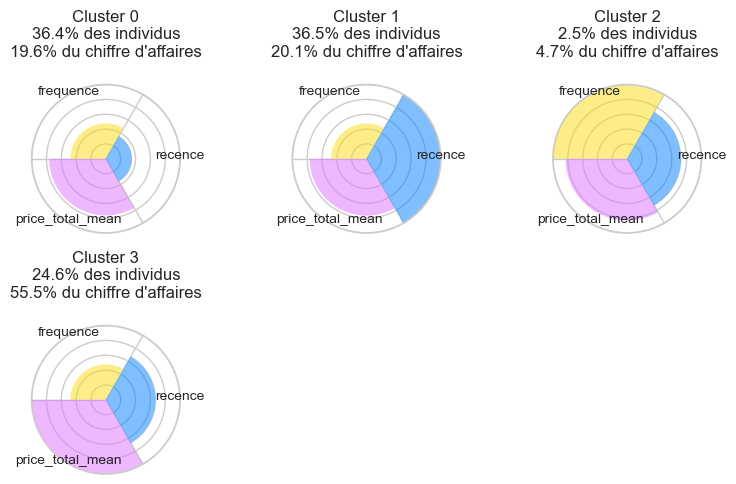

In [17]:
rfm_log_cls, rfm_log_cls_centers = clust(rfm_mean_log, 4)

## Feature Scaling
Nos données ne répondent pas toutes à une loi normale. Elles présentent quelques valeurs extrêmes.  
Nous testerons ici les méthodes suivantes :
* StandardScaler (voir Base), sensible aux outliers, se basant sur la moyenne
* Aucune transformation
* MinMaxScaler, qui ramène tout entre 0 et 1 ici (pas de valeurs négatives dans nos données)
* RobustScaler, très peu sensible aux outliers, s'appuyant sur les quartiles

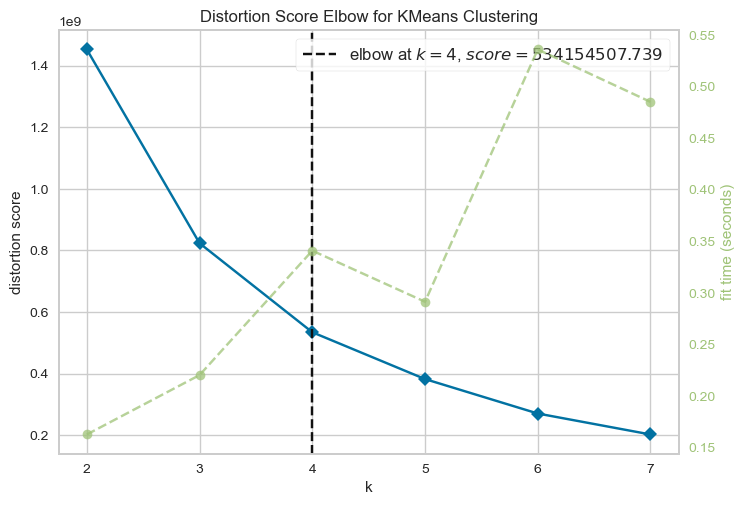

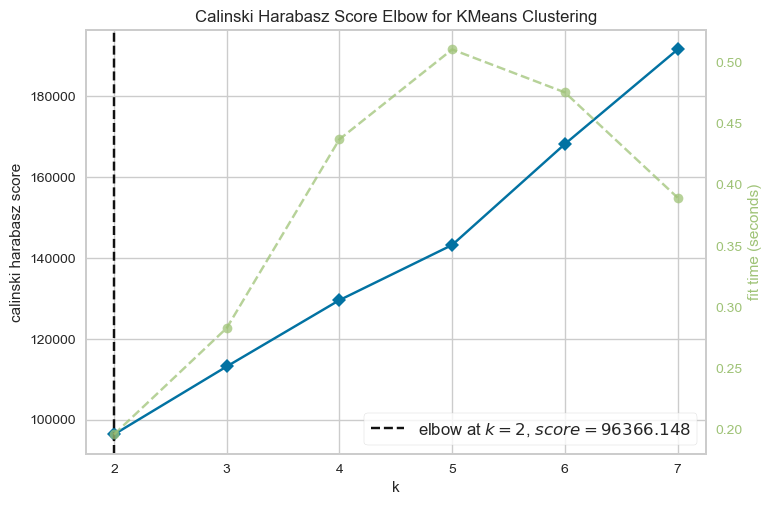

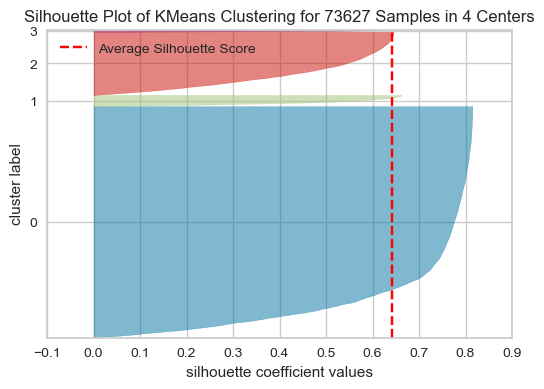

Silhouette score : 0.642


/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


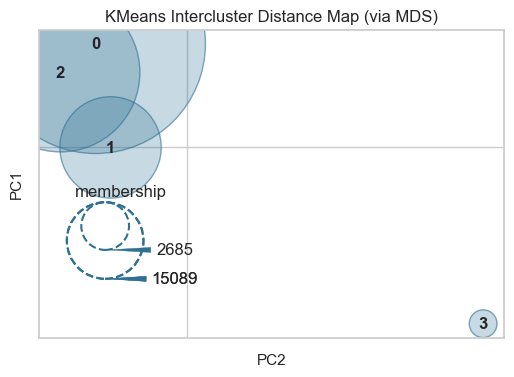

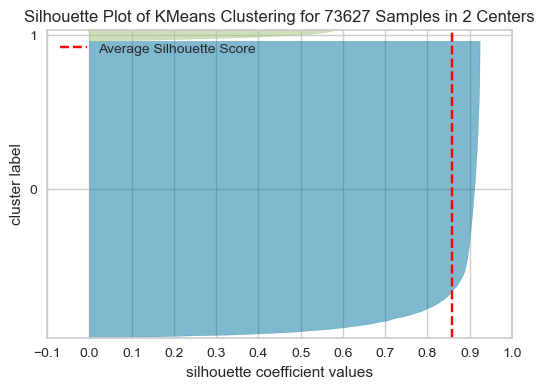

Silhouette score : 0.858


/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


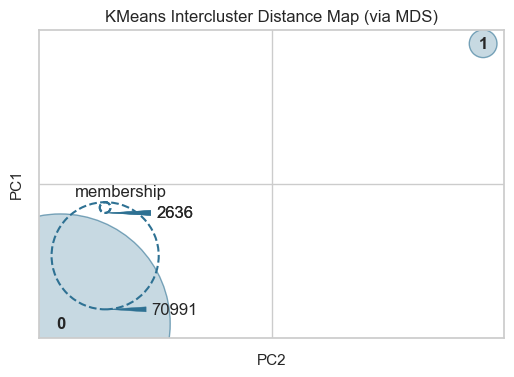

In [18]:
# les données étant déjà centrées-réduites dans le test de base,
# nous les travaillerons ici sans les centrer-réduire
# RFM_simple
X = rfm_simple
kmin = 2
kmax = 8

model = KMeans()

visualizer = KElbowVisualizer(model, k=(kmin, kmax))
visualizer.fit(X)
visualizer.show()
kopti1 = visualizer.elbow_value_

visualizer = KElbowVisualizer(
    model, k=(kmin, kmax), metric='calinski_harabasz')
visualizer.fit(X)
visualizer.show()
kopti2 = visualizer.elbow_value_

cls_viz(X, kopti1)
if kopti1 != kopti2:
    cls_viz(X, kopti2)

In [19]:
rfm_simple

,recence,frequence,price_total_mean
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,1.0,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,1.0,1,27.19
0000f6ccb0745a6a4b88665a16c9f078,0.0,1,43.62
0004aac84e0df4da2b147fca70cf8255,0.0,1,196.89
0004bd2a26a76fe21f786e4fbd80607f,1.0,1,166.98
...,...,...,...
fffb09418989a0dbff854a28163e47c6,0.0,1,73.16
fffbf87b7a1a6fa8b03f081c5f51a201,0.0,1,167.32
fffcc512b7dfecaffd80f13614af1d16,1.0,1,710.70


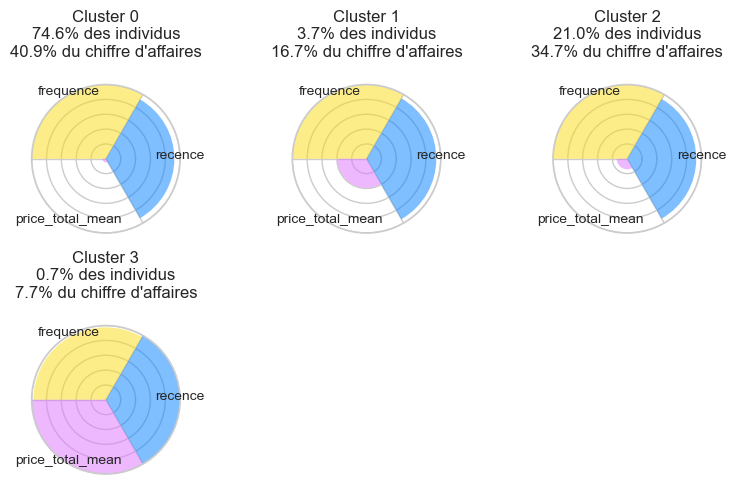

In [20]:
rfm_no_scale_cls, rfm_no_scale_rfm_centers = clust(rfm_simple, 4, 'aucun')

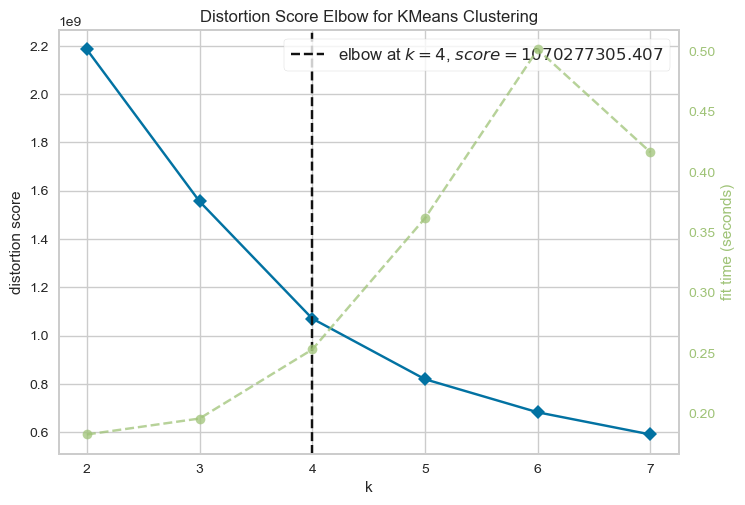

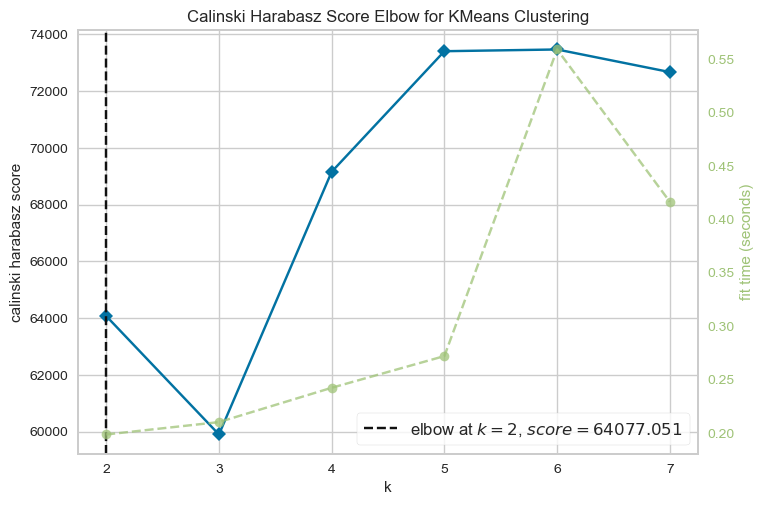

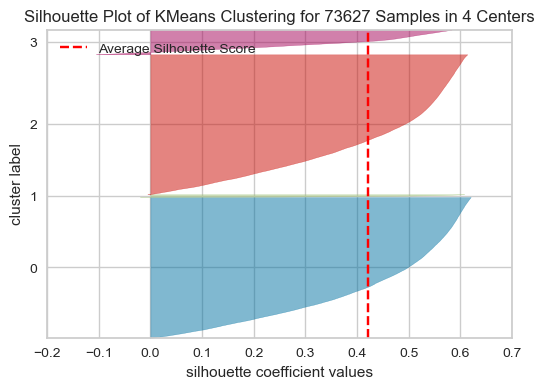

Silhouette score : 0.422


/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


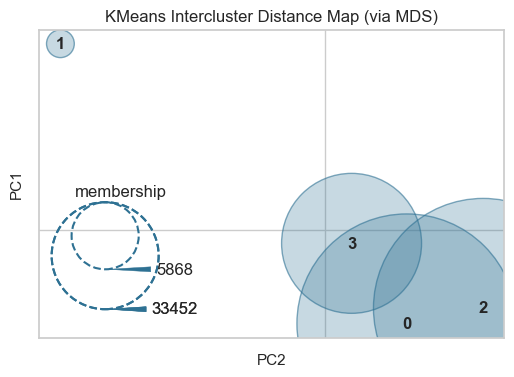

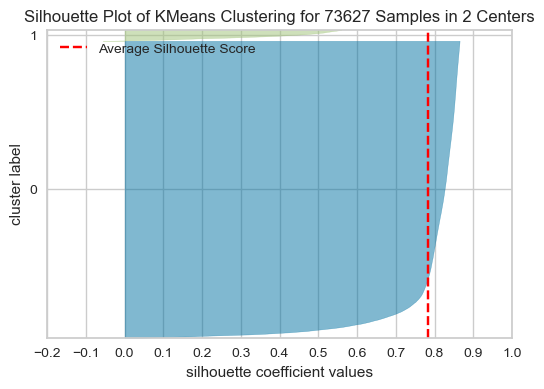

Silhouette score : 0.782


/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


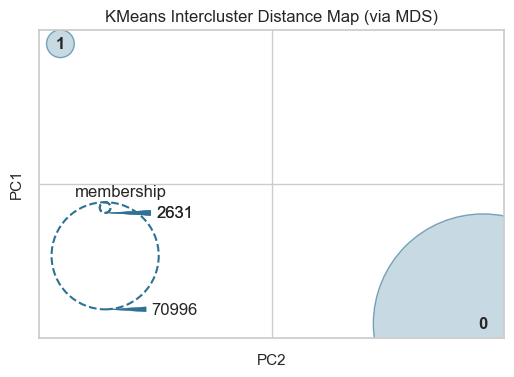

In [21]:
# les données étant déjà centrées-réduites dans le test de base,
# nous les travaillerons ici sans les centrer-réduire
X = rfm_mean
kmin = 2
kmax = 8

model = KMeans()

visualizer = KElbowVisualizer(model, k=(kmin, kmax))
visualizer.fit(X)
visualizer.show()
kopti1 = visualizer.elbow_value_

visualizer = KElbowVisualizer(
    model, k=(kmin, kmax), metric='calinski_harabasz')
visualizer.fit(X)
visualizer.show()
kopti2 = visualizer.elbow_value_

cls_viz(X, kopti1)
if kopti1 != kopti2:
    cls_viz(X, kopti2)

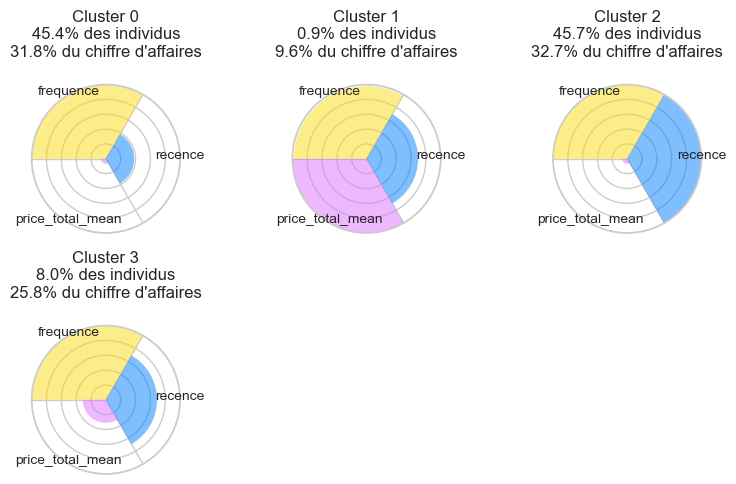

In [22]:
rfm_no_scale_cls, rfm_no_scale_rfm_centers = clust(rfm_mean, 4, 'aucun')

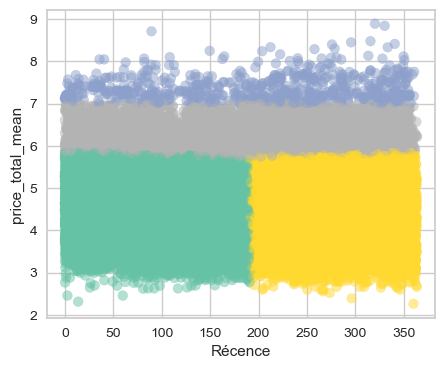

In [23]:
fig = plt.figure(figsize=(5, 4))

plt.scatter(x=rfm_no_scale_cls['recence'], y=np.log(
    rfm_no_scale_cls['price_total_mean']), c=rfm_no_scale_cls['cluster'], cmap='Set2', alpha=0.5)
plt.xlabel('Récence')
plt.ylabel('price_total_mean')

plt.show()

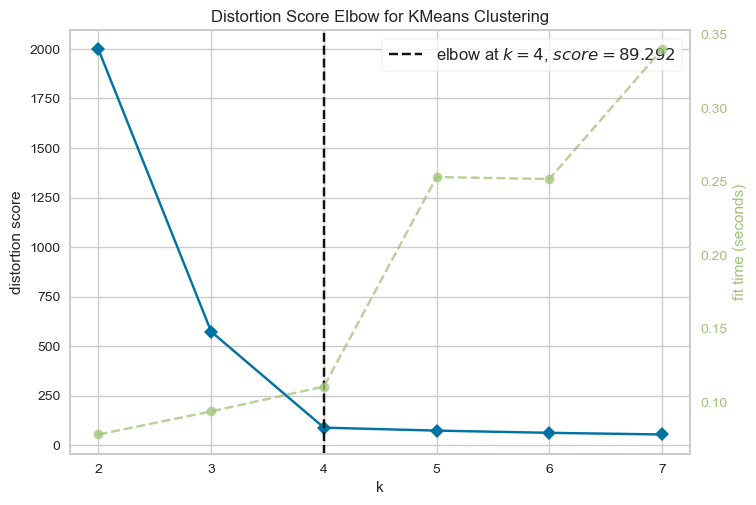

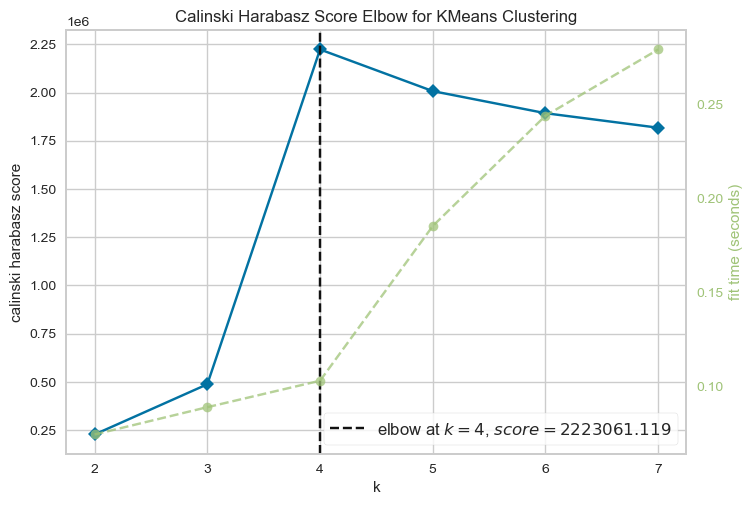

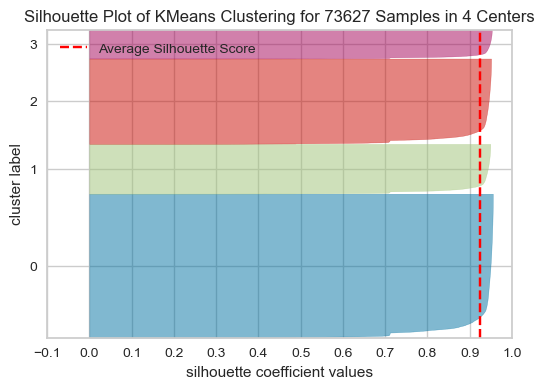

Silhouette score : 0.925


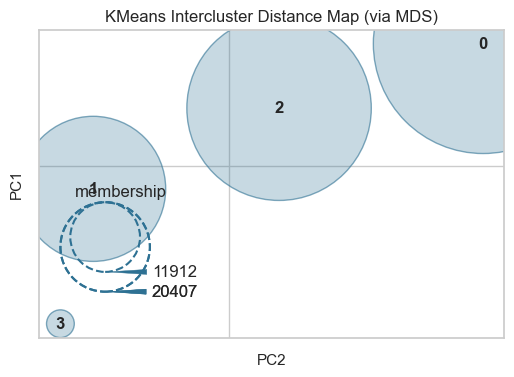

In [24]:
# les données sont déjà centrées-réduites dans le test de base avec StandardScaler,
# nous les travaillerons ici avec MinMaxScaler
# rfm_simple

X = rfm_simple
kmin = 2
kmax = 8

model = KMeans()

std_scale = preprocessing.MinMaxScaler().fit(X)
X_scaled = std_scale.transform(X)

visualizer = KElbowVisualizer(model, k=(kmin, kmax))
visualizer.fit(X_scaled)
visualizer.show()
kopti1 = visualizer.elbow_value_

visualizer = KElbowVisualizer(
    model, k=(kmin, kmax), metric='calinski_harabasz')
visualizer.fit(X_scaled)
visualizer.show()
kopti2 = visualizer.elbow_value_

cls_viz(X_scaled, kopti1)
if kopti1 != kopti2:
    cls_viz(X_scaled, kopti2)

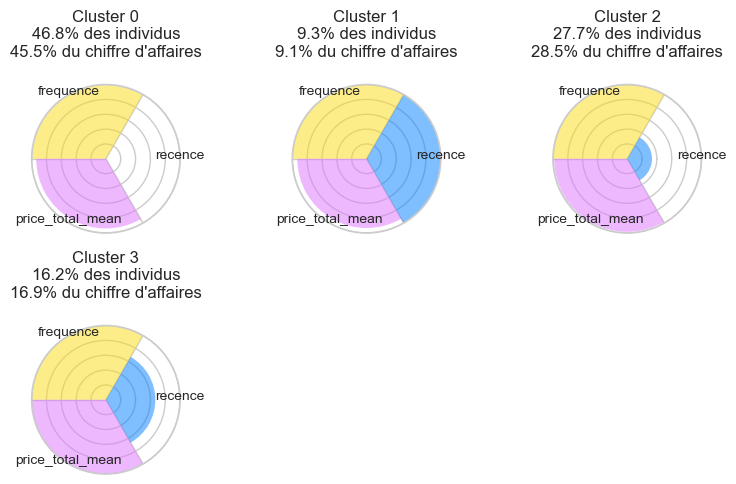

In [25]:
rfm_mean_minmax_simple_cls, rfm_mean_minmax_simple_cls_centers = clust(
    rfm_simple, 4, 'minmax')

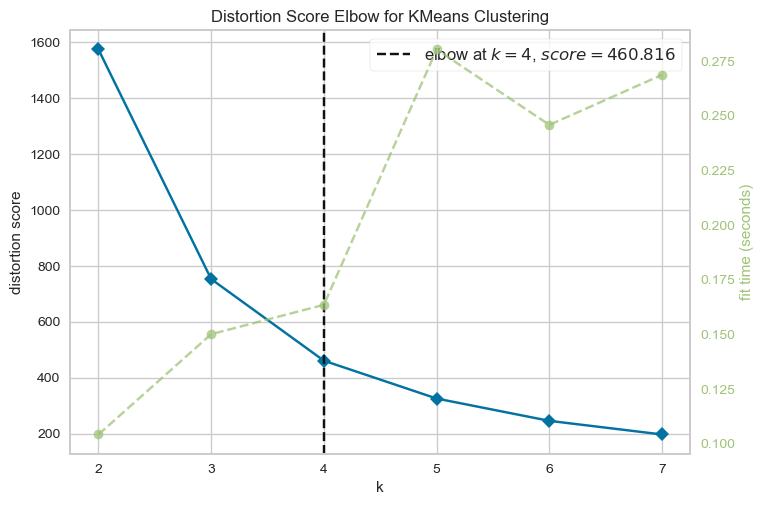

/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/yellowbrick/utils/kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/yellowbrick/cluster/elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


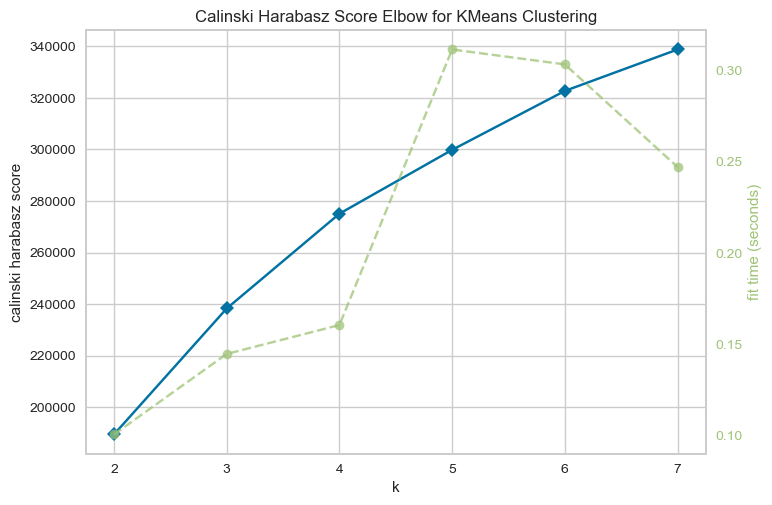

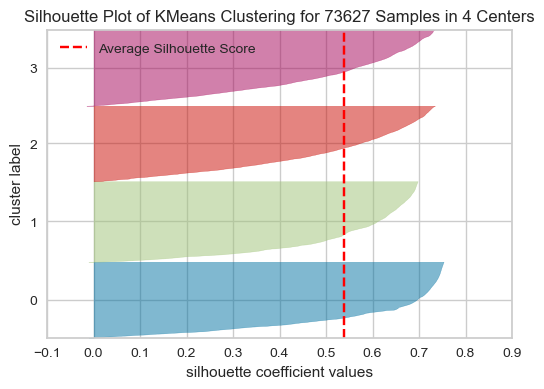

Silhouette score : 0.538


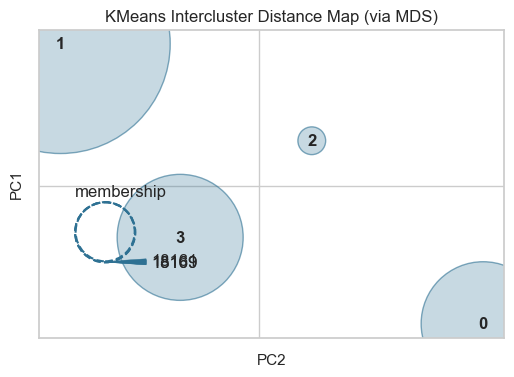

In [26]:
# les données sont déjà centrées-réduites dans le test de base avec StandardScaler,
# nous les travaillerons ici avec MinMaxScaler
X = rfm_mean
kmin = 2
kmax = 8

model = KMeans()

std_scale = preprocessing.MinMaxScaler().fit(X)
X_scaled = std_scale.transform(X)

visualizer = KElbowVisualizer(model, k=(kmin, kmax))
visualizer.fit(X_scaled)
visualizer.show()
kopti1 = visualizer.elbow_value_

visualizer = KElbowVisualizer(
    model, k=(kmin, kmax), metric='calinski_harabasz')
visualizer.fit(X_scaled)
visualizer.show()
if kopti2 is not None:
    kopti2 = visualizer.elbow_value_

cls_viz(X_scaled, kopti1)
if (kopti1 != kopti2) & (kopti2 is not None):
    cls_viz(X_scaled, kopti2)

C'est beaucoup plus intéressant, puisque les clusters sont cette fois mieux séparés. Voyons si côté métier les résultats ont du sens...

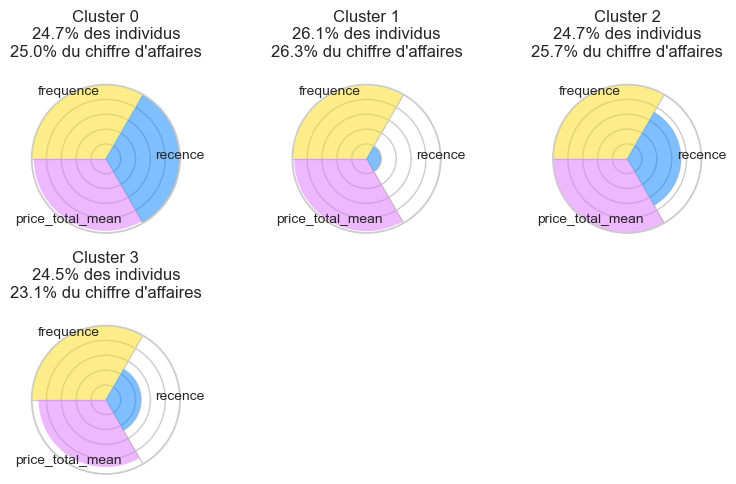

In [27]:
rfm_mean_minmax_cls, rfm_mean_minmax_cls_centers = clust(rfm_mean, 4, 'minmax')

Malheureusement non. Ce n'est pas exploitable...

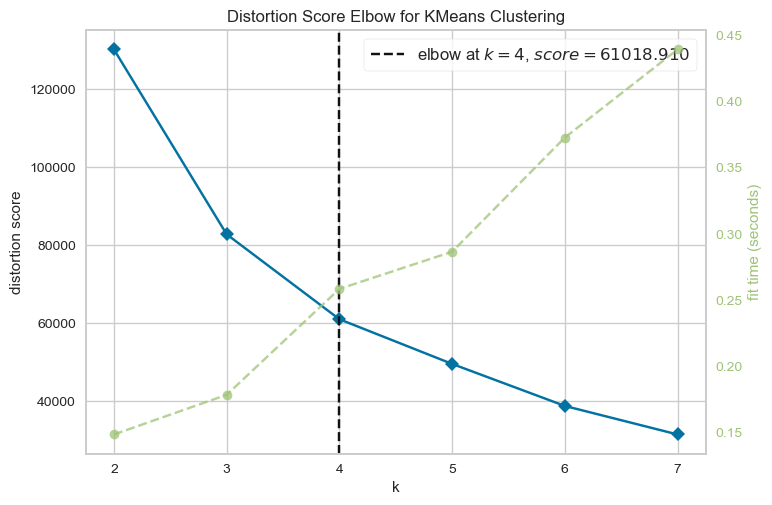

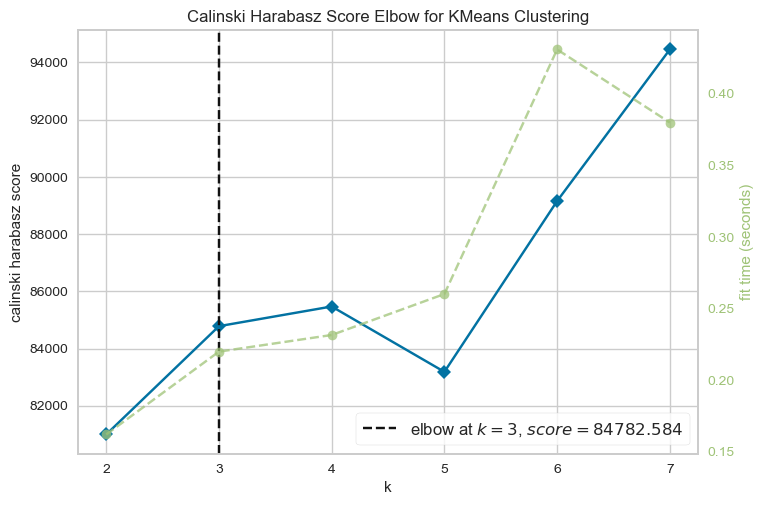

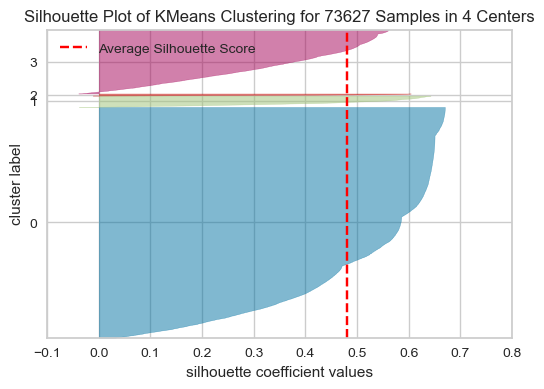

Silhouette score : 0.481


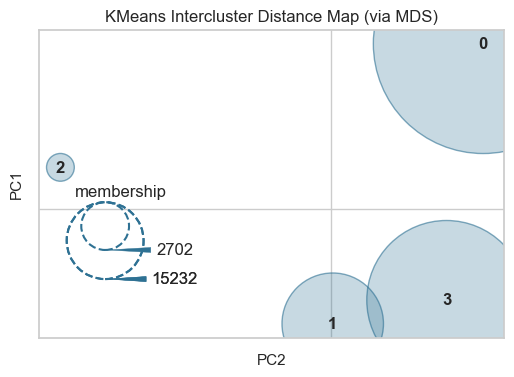

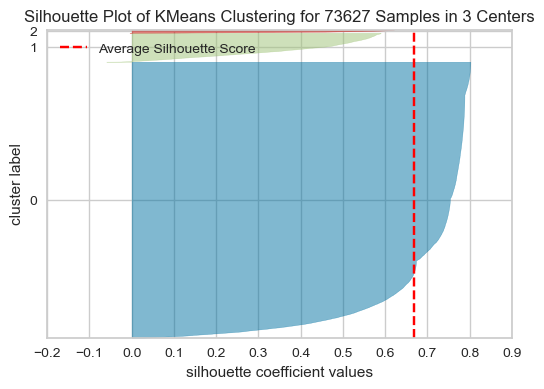

Silhouette score : 0.669


/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:512: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


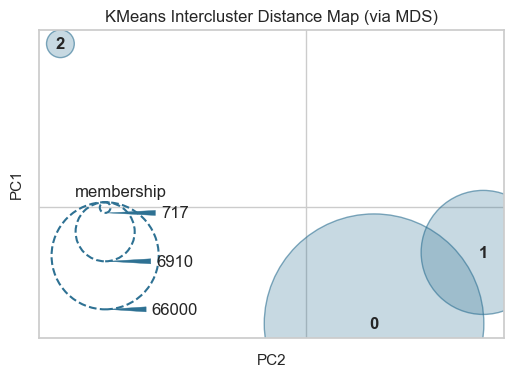

In [28]:
# Testons enfin RobustScaler
# rfm_simple

X = rfm_simple
kmin = 2
kmax = 8

model = KMeans()

std_scale = preprocessing.RobustScaler().fit(X)
X_scaled = std_scale.transform(X)

visualizer = KElbowVisualizer(model, k=(kmin, kmax))
visualizer.fit(X_scaled)
visualizer.show()
kopti1 = visualizer.elbow_value_

visualizer = KElbowVisualizer(
    model, k=(kmin, kmax), metric='calinski_harabasz')
visualizer.fit(X_scaled)
visualizer.show()
kopti2 = visualizer.elbow_value_

cls_viz(X_scaled, kopti1)
if kopti1 != kopti2:
    cls_viz(X_scaled, kopti2)

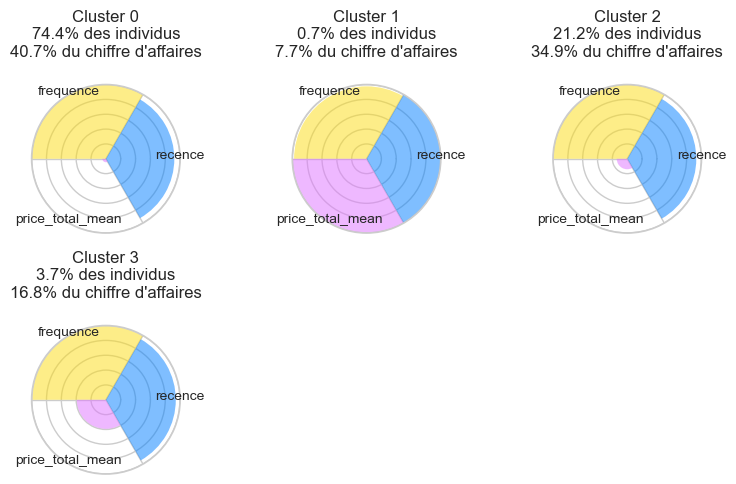

In [29]:
rfm_mean_robust_simple_cls, rfm_mean_robust_simple_cls_centers = clust(
    rfm_simple, 4, 'robust')

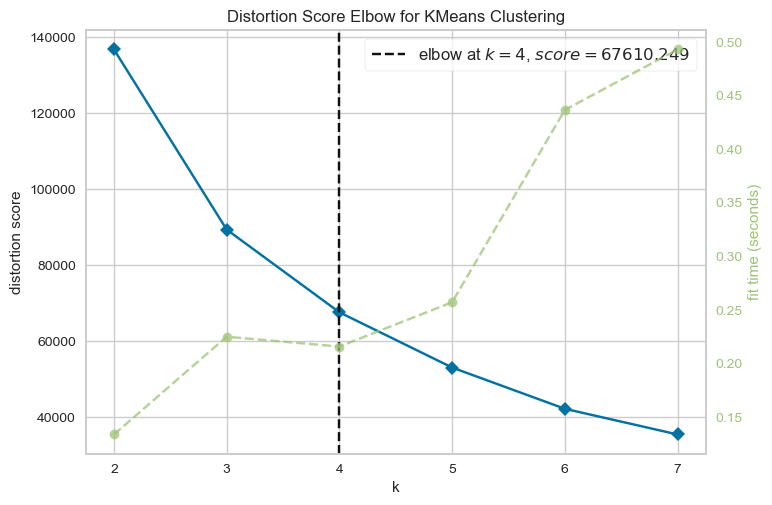

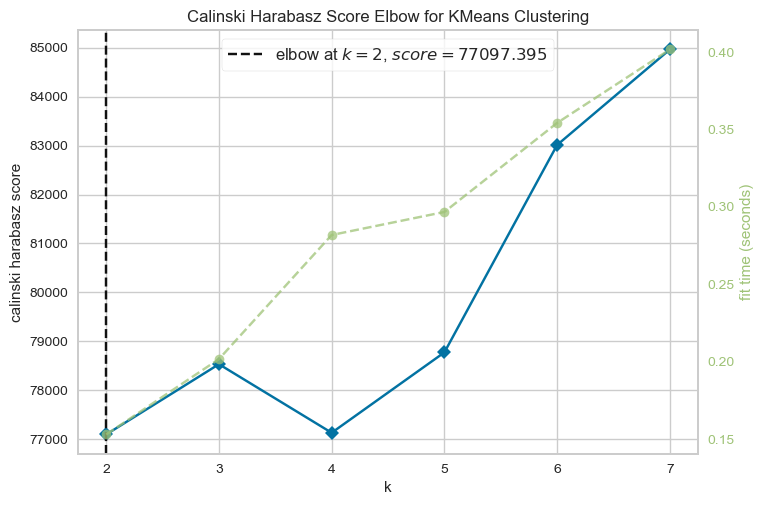

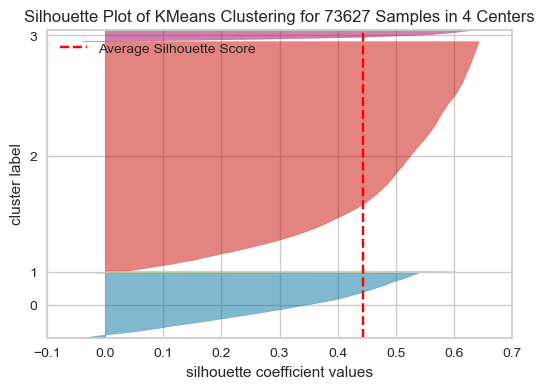

Silhouette score : 0.443


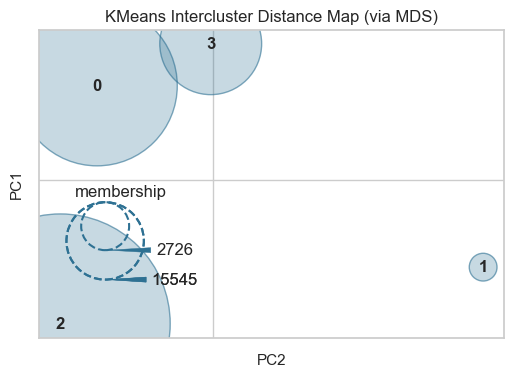

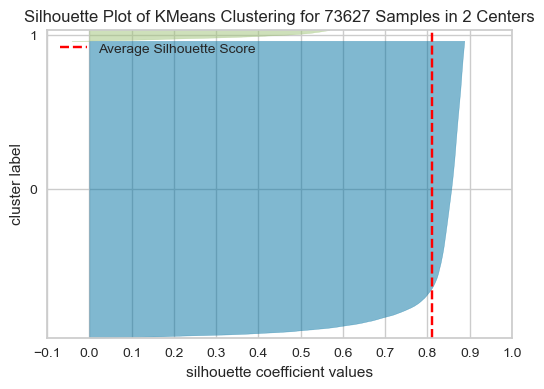

Silhouette score : 0.81


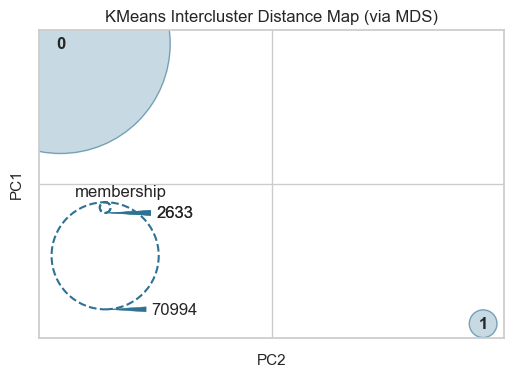

In [30]:
# Testons enfin RobustScaler
X = rfm_mean
kmin = 2
kmax = 8

model = KMeans()

std_scale = preprocessing.RobustScaler().fit(X)
X_scaled = std_scale.transform(X)

visualizer = KElbowVisualizer(model, k=(kmin, kmax))
visualizer.fit(X_scaled)
visualizer.show()
kopti1 = visualizer.elbow_value_

visualizer = KElbowVisualizer(
    model, k=(kmin, kmax), metric='calinski_harabasz')
visualizer.fit(X_scaled)
visualizer.show()
kopti2 = visualizer.elbow_value_

cls_viz(X_scaled, kopti1)
if kopti1 != kopti2:
    cls_viz(X_scaled, kopti2)

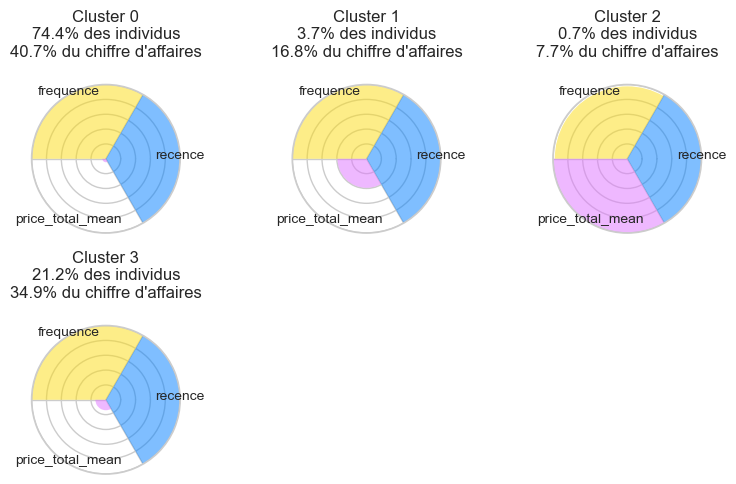

In [31]:
rfm_mean_robust_cls, rfm_mean_robust_cls_centers = clust(rfm_mean, 4, 'robust')

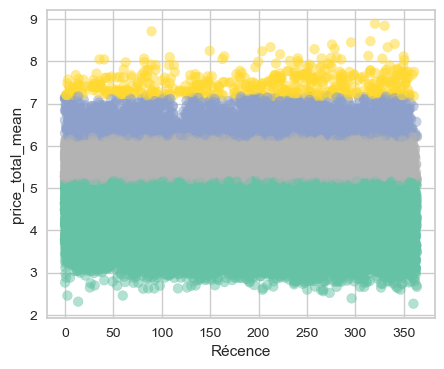

In [32]:
fig = plt.figure(figsize=(5, 4))

plt.scatter(x=rfm_mean_robust_cls['recence'], y=np.log(
    rfm_mean_robust_cls['price_total_mean']), c=rfm_mean_robust_cls['cluster'], cmap='Set2', alpha=0.5)
plt.xlabel('Récence')
plt.ylabel('price_total_mean')

plt.show()

Les scalers MinMax et Robust nous donnent des clusters bien séparés au final, mais plus difficilement exploitable. Pour MinMax les clusters se différencient uniquement sur la récence. Les résultats sont meilleurs sur RobustScaler si ce n'est pour le prix total moyen, peu différenciable d'un cluster à l'autre. On le retrouve sur les proportions individus/chiffre d'affaires. Avec le StandardScaler on a de vraies différences, mais ici les proportions sont à peu près identiques.

## Nombre de variables
C'est une sorte de test naïf. Il sera forcément mauvais. Il nous donnera une limite basse pour le silhouette score.

In [33]:
complete_no_log.shape

(73627, 52)

/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/yellowbrick/utils/kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/yellowbrick/cluster/elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


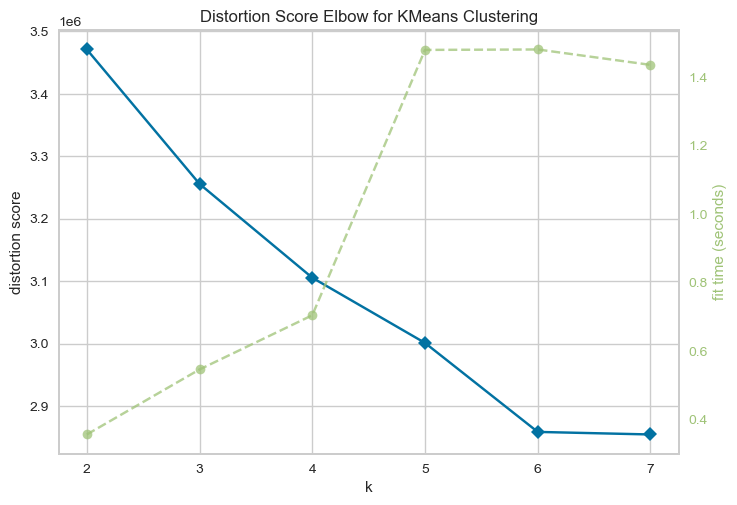

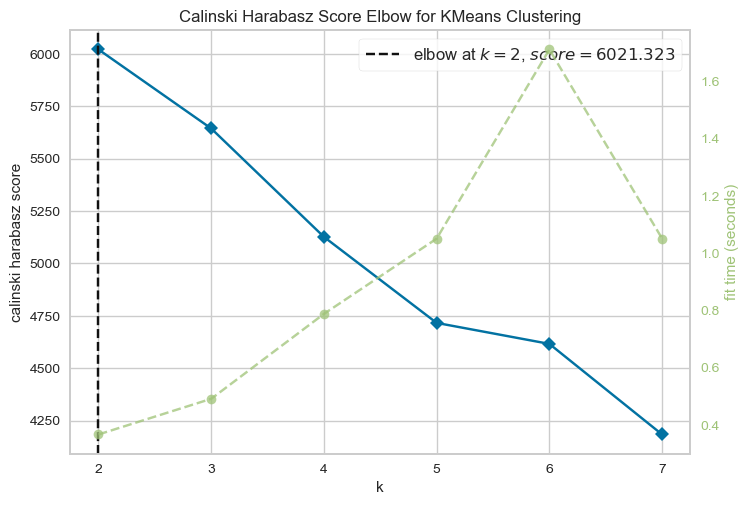

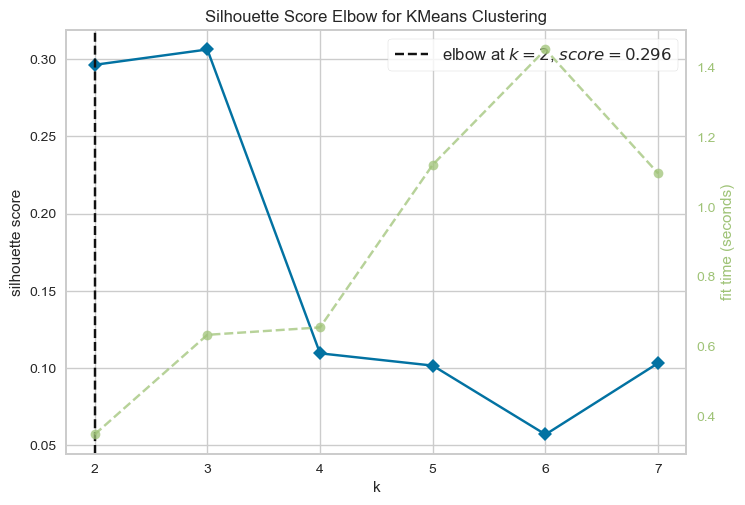

Pas de valeur de k optimale avec la metrics Distortion


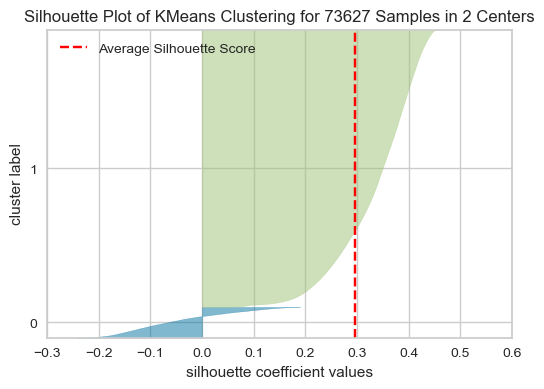

Silhouette score : 0.296


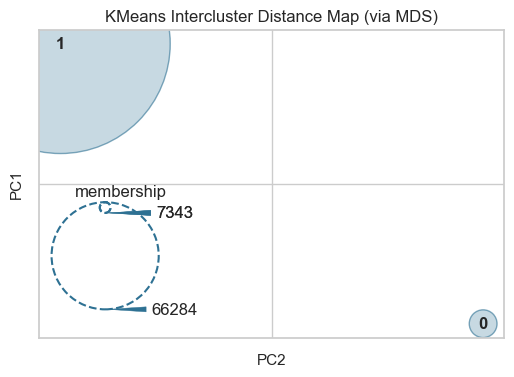

In [34]:
k_var = km(complete_no_log, 2, 8)

## Méthode
Nous allons tester ici d'autres algorythmes que le K-Means.


passé en markdown car fait planter le noyau

'# DBSCAN
X=rfm_mean

std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)
epsilon=np.linspace(3,4,4)

silhouettes = []
for epsi in epsilon:
    cls = cluster.DBSCAN(eps=epsi)
    cls.fit(X_scaled)
    silh = metrics.silhouette_score(X_scaled, cls.labels_)
    silhouettes.append(silh)
    print(f'{int(pd.DataFrame(cls.labels_).nunique())} clusters pour eps = {epsi} avec silhouette_score = {round(silh,2)}')
plt.plot(epsilon, silhouettes, marker='o')

In [35]:
X = rfm_mean

std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

In [36]:
cls_dbscan = cluster.DBSCAN(eps=1.25)
cls_dbscan.fit(X_scaled)

DBSCAN(eps=1.25)

In [37]:
silh = metrics.silhouette_score(X_scaled, cls_dbscan.labels_)
print(f'{int(pd.DataFrame(cls_dbscan.labels_).nunique())} clusters pour eps = 1.25 avec silhouette_score = {round(silh,3)}')

6 clusters pour eps = 1.25 avec silhouette_score = 0.729


**DBSCAN**  
62 clusters pour eps=0.1  
33 clusters pour eps=0.2  
16 clusters pour eps=0.30000000000000004  
13 clusters pour eps=0.4  
12 clusters pour eps=0.5  
10 clusters pour eps=0.7  
6 clusters pour eps=0.8999999999999999  
7 clusters pour eps=1.1  
6 clusters pour eps=1.3  
7 clusters pour eps=1.5  
7 clusters pour eps=1.75  
6 clusters pour eps=2.0  
6 clusters pour eps=2.25  
7 clusters pour eps = 1.75 avec silhouette_score = 0.7090812086244582  
6 clusters pour eps = 2.0 avec silhouette_score = 0.7096998546473202  
6 clusters pour eps = 2.25 avec silhouette_score = 0.7097706913360177  
6 clusters pour eps = 2.5 avec silhouette_score = 0.7098580329664229  
7 clusters pour eps = 2.75 avec silhouette_score = 0.71  
7 clusters pour eps = 3.0 avec silhouette_score = 0.71  

In [38]:
rfm_mean_meth = rfm_mean.copy()
rfm_mean_meth['cluster'] = cls_dbscan.labels_

In [39]:
rfm_mean_meth['cluster'].unique()

array([ 0,  1,  2,  3, -1,  4])

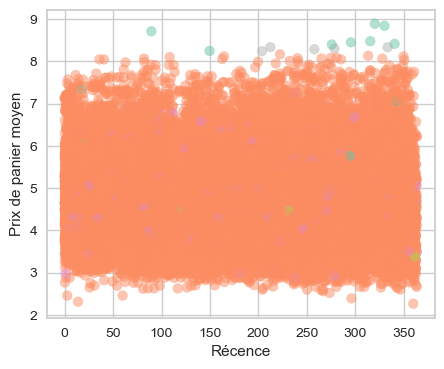

In [40]:
fig = plt.figure(figsize=(5, 4))

plt.scatter(x=rfm_mean_meth['recence'], y=np.log(
    rfm_mean_meth['price_total_mean']), c=rfm_mean_meth['cluster'], cmap='Set2', alpha=0.5)
plt.xlabel('Récence')
plt.ylabel('Prix de panier moyen')

plt.show()

D'un point de vue métier, les clusters créés par le DBScan ne sont pas explicables.
La méthode est donc abandonnée.

In [41]:
# AgglomerativeClustering : fait planter le noyau systématiquement - ABANDON

# kmin=2
# kmax=3

#silhouettes = []
# for num_clusters in range(kmin, kmax):
#    cls = cluster.AgglomerativeClustering(n_clusters=num_clusters)
#    cls.fit(X_scaled)
#    silh = metrics.silhouette_score(X_scaled, cls.labels_)
#    silhouettes.append(silh)
#plt.plot(range(kmin, kmax), silhouettes, marker='o')

In [42]:
# fait également planter le noyau

#cls_ac = cluster.AgglomerativeClustering(n_clusters=4)
# cls_ac.fit(X_scaled)

In [43]:
#silh_ac4 = metrics.silhouette_score(X_scaled, cls_ac.labels_)
# silh_ac4

## Complexité des variables
Nous allons donner uniquement 4 valeurs à la variables récence et voir l'impact sur le silhouette_score :
* 3 pour une récence de moins d'un mois
* 2 pour une récence datant de 1 à 3 mois
* 1 pour une récence de 3 à 6 mois
* 0 pour une récence supérieure à 6 mois

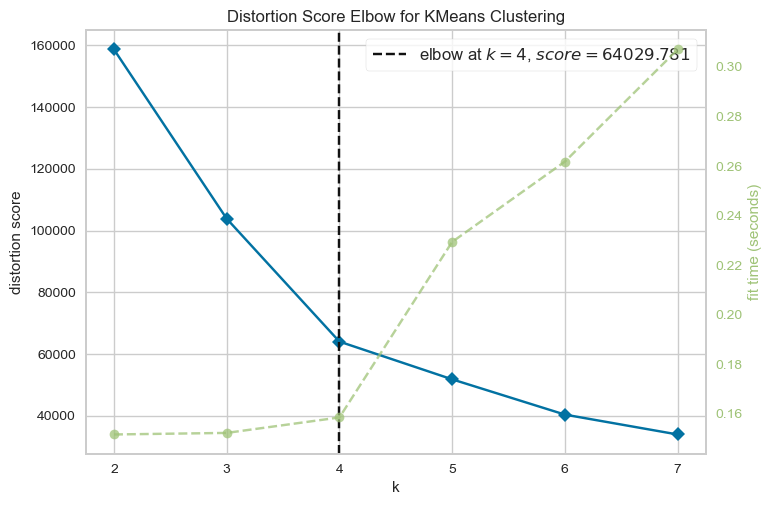

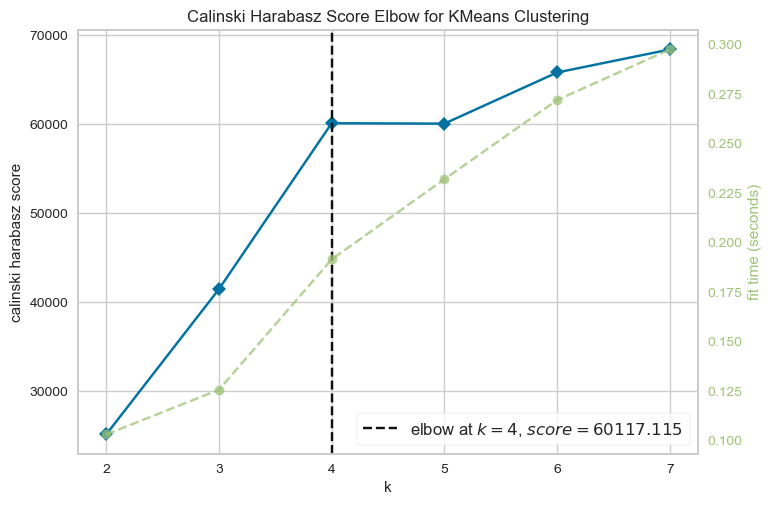

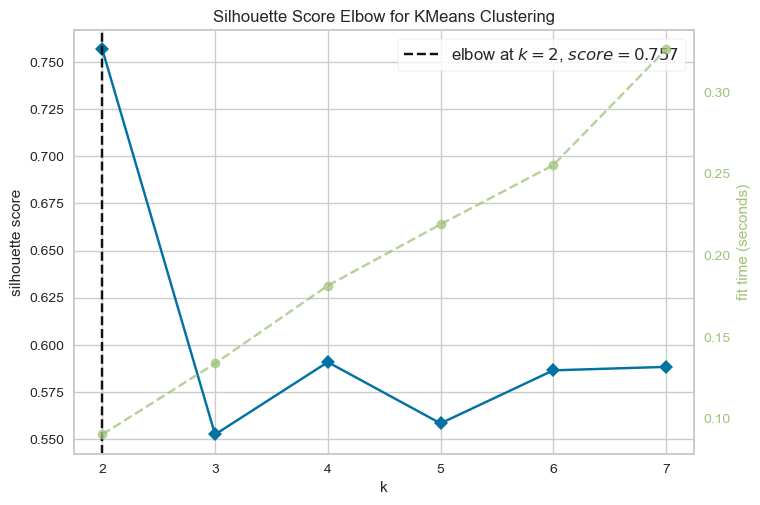

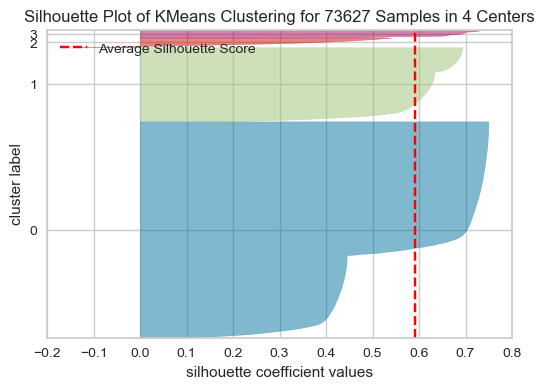

Silhouette score : 0.591


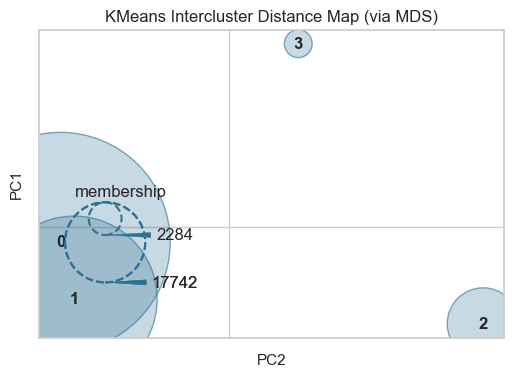

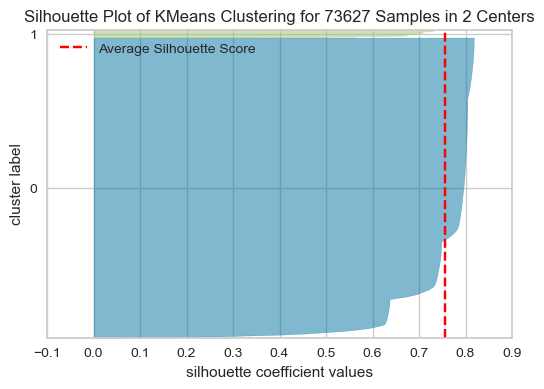

Silhouette score : 0.757


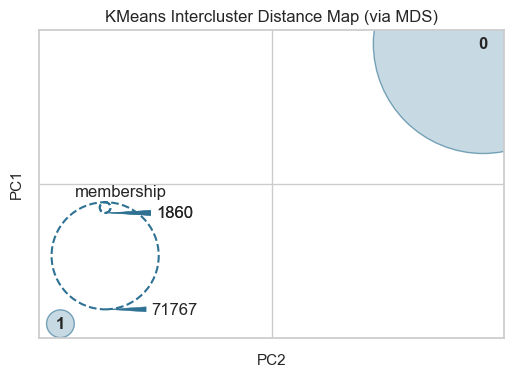

In [44]:
k_simple = km(rfm_simple, 2, 8)

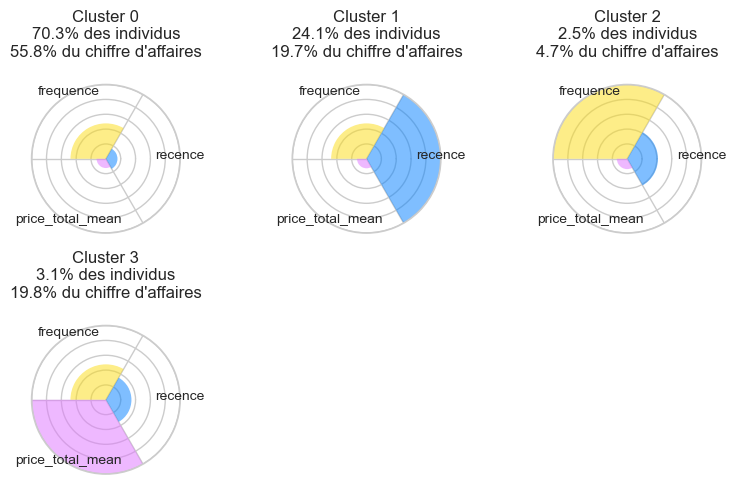

In [45]:
rfm_simple_cls, rfm_simple_cls_centers = clust(rfm_simple, k_simple)

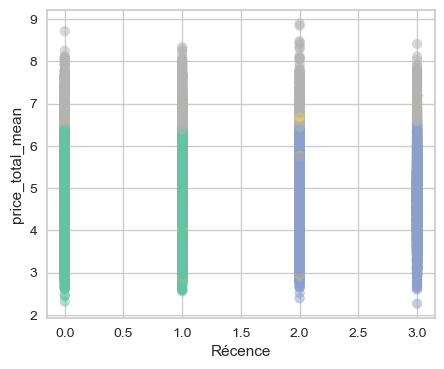

In [46]:
fig = plt.figure(figsize=(5, 4))

plt.scatter(x=rfm_simple_cls['recence'], y=np.log(
    rfm_simple_cls['price_total_mean']), c=rfm_simple_cls['cluster'], cmap='Set2', alpha=0.5)
plt.xlabel('Récence')
plt.ylabel('price_total_mean')

plt.show()

## Stabilité du K-Means
Nous allons ici imposer différentes initialisations pour les centroïds du K-means afin de vérifier la stabilité de la position finale des centres des clusters.

In [47]:
# Test de la position de départ des centroïds avec n_init=1
silhouettes = []
centres = pd.DataFrame(columns=['Recence', 'Frequence', 'Montant'])
nr_random_state = [0, 1, 5, 17, 25, 32, 37, 42, 50]
num_clusters = 4
i = 0
X_scaled = standard(rfm_mean)

for nr in nr_random_state:
    cls = cluster.KMeans(n_clusters=num_clusters,
                         n_init=1, init='k-means++', random_state=nr)
    cls.fit(X_scaled)
    silh = metrics.silhouette_score(X_scaled, cls.labels_)
    silhouettes.append(silh)
    centres = pd.concat([centres, pd.DataFrame(cls.cluster_centers_, columns=[
                        'Recence', 'Frequence', 'Montant'])], axis=0)
    i = i+1

centres.reset_index(inplace=True)

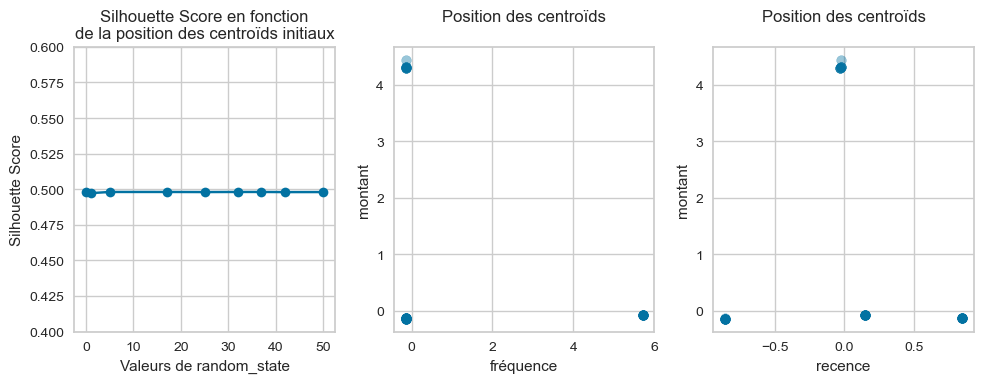

In [48]:
# Construction des graphiques
fig = plt.figure(figsize=(10, 4))
ax = plt.subplot(1, 3, 1)
plt.plot(nr_random_state, silhouettes, marker='o')
plt.xlabel('Valeurs de random_state')
plt.ylim(0.4, 0.6)
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score en fonction\nde la position des centroïds initiaux')
ax = plt.subplot(1, 3, 2)
plt.scatter(centres['Frequence'], centres['Montant'], marker='o', alpha=0.4)
plt.xlabel('fréquence')
plt.ylabel('montant')
plt.title('Position des centroïds\n')
ax = plt.subplot(1, 3, 3)
plt.scatter(centres['Recence'], centres['Montant'], marker='o', alpha=0.4)
plt.xlabel('recence')
plt.ylabel('montant')
plt.title('Position des centroïds\n')
plt.tight_layout()
plt.show()

Les clusters générés sont stables.

## Conclusion

Tableau récapitulatif des résultats pour 4 clusters :  
  
|Paramètre testé|Scaling|Transf. log|Méthode|Nombre de variables|Silhouette_score|Nombre de clusters|Séparation des clusters|Exploitation métier|
|:---|:---:|:---:|:---|:---:|:---:|:---|:---|:---|
|Base|StandardScaler||KMeans|3 - base|0,498|4|chevauchement de 2 clusters|Aisée|
|Transformation log|StandardScaler|oui|KMeans|3 - log sur price_total_mean|0,368|4|clusters presque bien séparés|Aisée|
|Feature scaling|||KMeans|3 - codage recence|0,641|4|superposition de 3 clusters|discrimination sur price|
|Feature scaling|||KMeans|3 - base|0,422|4|chevauchement de 3 clusters|discrimination sur recence et price, pas sur frequence|
|Feature scaling|MinMaxScaler||KMeans|3 - codage recence|0,925|4|bonne séparation|discrimination sur recence uniquement|
|Feature scaling|MinMaxScaler||KMeans|3 - base|0,538|4|bon|discrimination sur recence uniquement|
|Feature scaling|RobustScaler||KMeans|3 - codage recence|0,483|4|chevauchement de 3 clusters|discrimination sur price uniquement|
|Feature scaling|RobustScaler||KMeans|3 - base|0,448|4|superposition de 2 clusters|discrimination sur price uniquement|
|Nombre de variables|StandardScaler||KMeans|60|0,296|2|||
|Méthode|StandardScaler||DBSCAN|3 - base|0,729|6/7||inexploitable|
|Complexité des variables|StandardScaler||KMeans|3 - codage recence|0,591|4|Chevauchement de 2 clusters|Aisé|
  
* Nous utiliserons donc des données sans transformation log et centrées-réduites. MinMaxScaler donne de meilleurs résultats en terme de silhouette_score, et les clusters sont bien séparés. Cependant les clusters ne sont pas identifiables d'un point de vue métier. Le RobustScaler n'apporte rien de plus. Nous garderons donc le StandardScaler, bien qu'il soit destiné aux distributions répondant à une loi normale et que nos distributions n'y répondent pas toutes.  
* Nous tenterons de réduire au maximum le nombre de variables pour chaque clustering.  
* Réduire la complexité des variables, en les codant par exemple sur 4 valeurs au lieu d'avoir des valeurs continues, améliore le silhouette_score mais les clusters restent à peu près les mêmes. Le gain sur le score semble artificiel. Je pense que le score s'améliore au détriment de la qualité du traitement des données sur lesquelles on a supprimé de l'information. Nous ne réduirons les données que lorsqu'il y aura une logique à le faire. Par exemple pour le retard, 3 classes suffiront : pas de retard, retard inférieur à 1 semaine, et gros retard supérieur à une semaine. Que le retard soit de 3 ou 4 semaines ne change plus grand chose au désagrément occasionné et au fait qu'il soit innacceptable.
* Pour la méthode, le KMeans fonctionne bien. Le DBSCAN donne de meilleurs résultats sur le silhouette_score mais les clusters générés sont inexploitables. Il n'y a pas de logique à avoir des clusters concaves ou d'autres formes.
* Les données nous permettent bien d'avoir des positions de centres de clusters stables. Le K-Means semble donc parfaitement adapté au jeu de données.

# Segmentations
## RFM
Dans un premier temps nous allons faire basiquement une segmentation RFM.  
Nous allons comparer les résultats de deux RFM, une avec le montant moyen des paniers, et une avec le montant total.  
Si les deux sont valables, nous partirons sur le panier moyen, pour ne pas venir donner deux fois du poids à la fréquence.

In [49]:
X = rfm_mean.values

std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

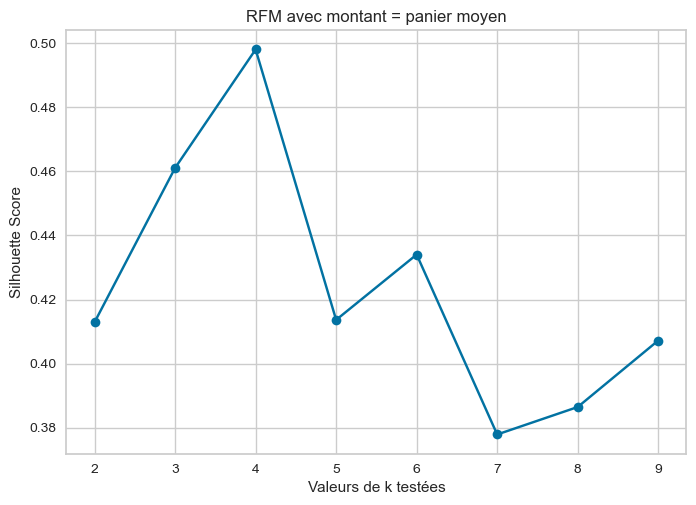

In [50]:
silhouettes = []
kmin = 2
kmax = 10
for num_clusters in range(kmin, kmax):
    cls = cluster.KMeans(n_clusters=num_clusters,
                         n_init=4, init='random')
    cls.fit(X_scaled)
    silh = metrics.silhouette_score(X_scaled, cls.labels_)
    silhouettes.append(silh)
plt.plot(range(kmin, kmax), silhouettes, marker='o')
plt.xlabel('Valeurs de k testées')
plt.ylabel('Silhouette Score')
plt.title('RFM avec montant = panier moyen')
plt.show()

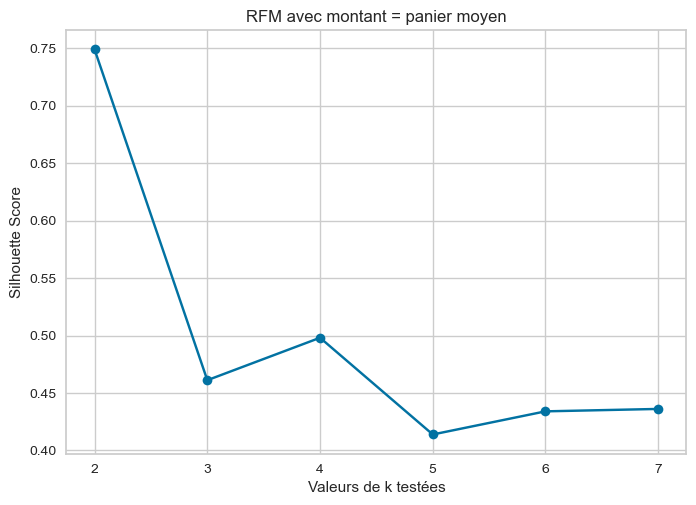

In [51]:
silhouettes = []
kmin = 2
kmax = 8
for num_clusters in range(kmin, kmax):
    cls = cluster.KMeans(n_clusters=num_clusters,
                         n_init=4, init='k-means++')
    cls.fit(X_scaled)
    silh = metrics.silhouette_score(X_scaled, cls.labels_)
    silhouettes.append(silh)
plt.plot(range(kmin, kmax), silhouettes, marker='o')
plt.xlabel('Valeurs de k testées')
plt.ylabel('Silhouette Score')
plt.title('RFM avec montant = panier moyen')
plt.show()

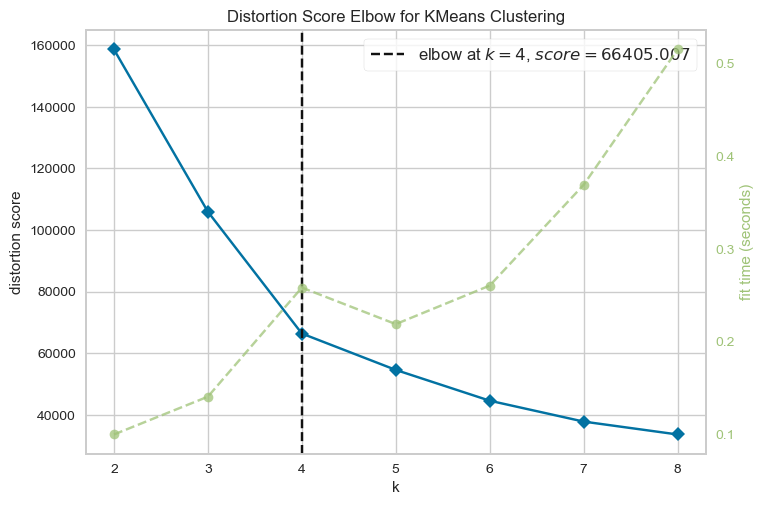

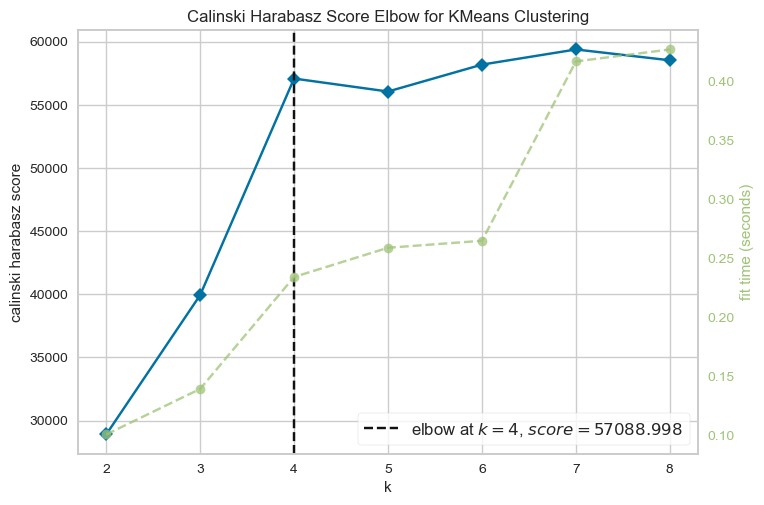

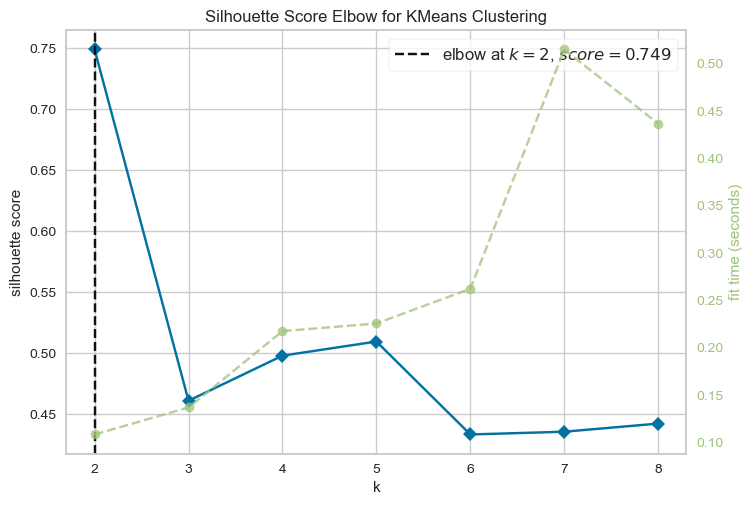

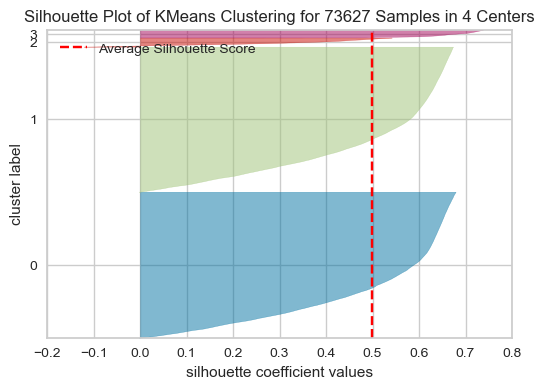

Silhouette score : 0.498


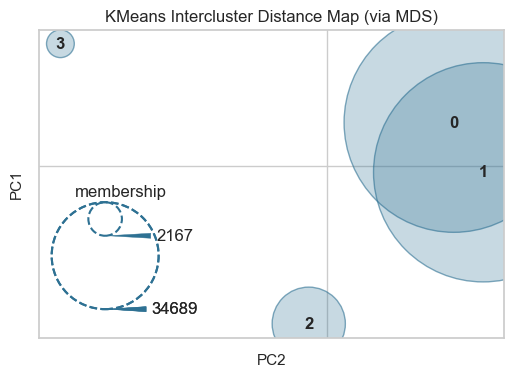

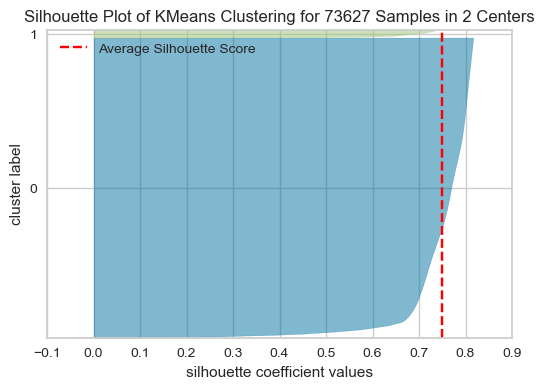

Silhouette score : 0.749


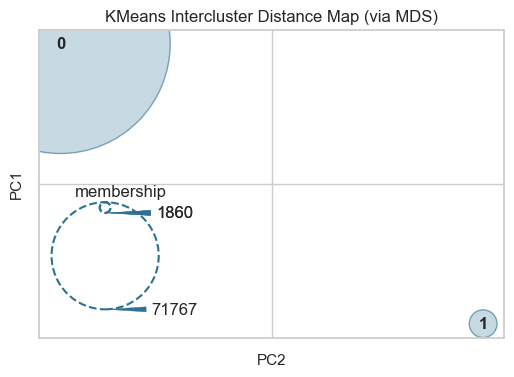

In [52]:
k_rfm = km(rfm_mean, 2, 9)

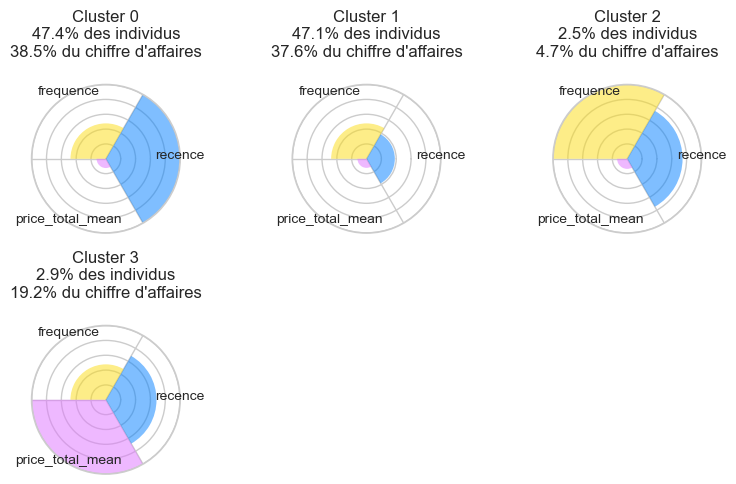

In [53]:
rfm_mean_cls, rfm_mean_cls_centers = clust(rfm_mean, k_rfm)

|Cluster|% de clients|% de CA|Type de clients|
|:---|:---:|:---:|:---|
|0|47,4 %|38,5 %|Nouveaux clients|
|1|47,1 %|37,6 %|Clients inactifs, pas de commande récente, une seule commande sur la dernière année, et montant du panier faible|
|2| 2,5 %| 4,7 %|Clients réguliers, montant moyen du panier faible|
|3| 2,9 %|19,2 %|Très bons clients sur le montant des paniers, récence moyenne|

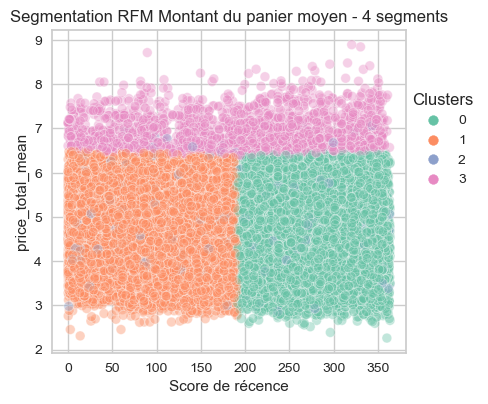

In [54]:
fig = plt.figure(figsize=(5, 4))

sns.scatterplot(x=rfm_mean_cls['recence'], y=np.log(
    rfm_mean_cls['price_total_mean']), hue=rfm_mean_cls['cluster'], alpha=0.4, palette='Set2')
plt.xlabel('Score de récence')
plt.ylabel('price_total_mean')
plt.legend(loc=(1, 0.5), title='Clusters')
plt.tight_layout()
plt.title("Segmentation RFM Montant du panier moyen - 4 segments")
plt.show()

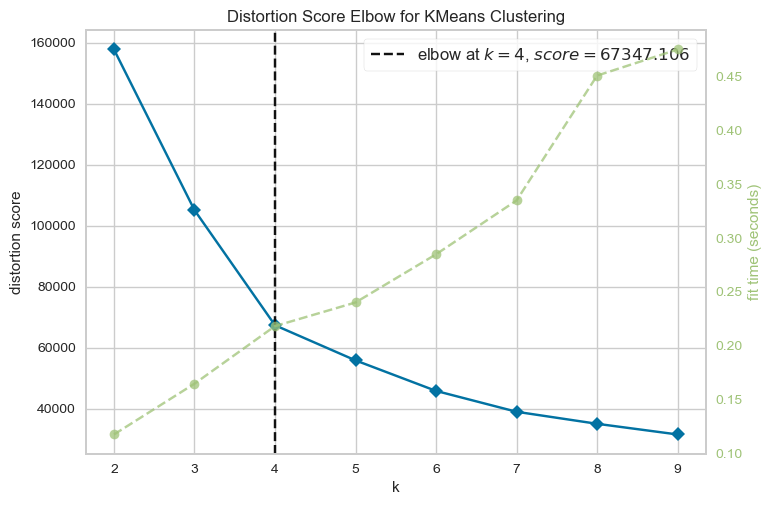

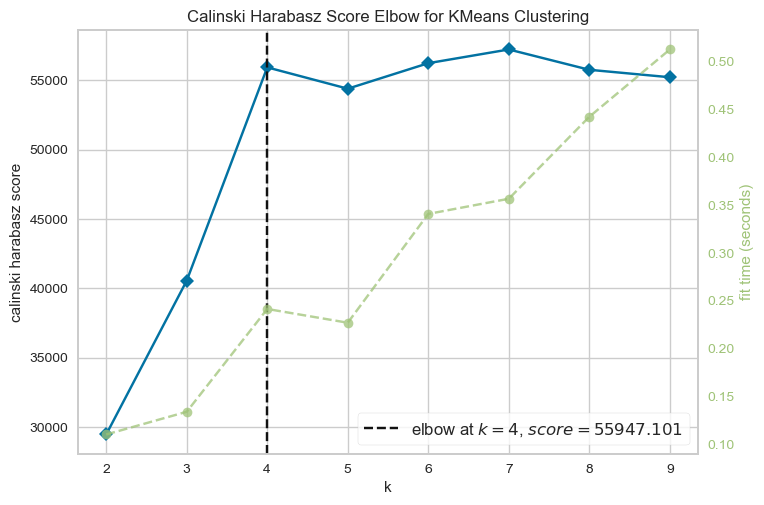

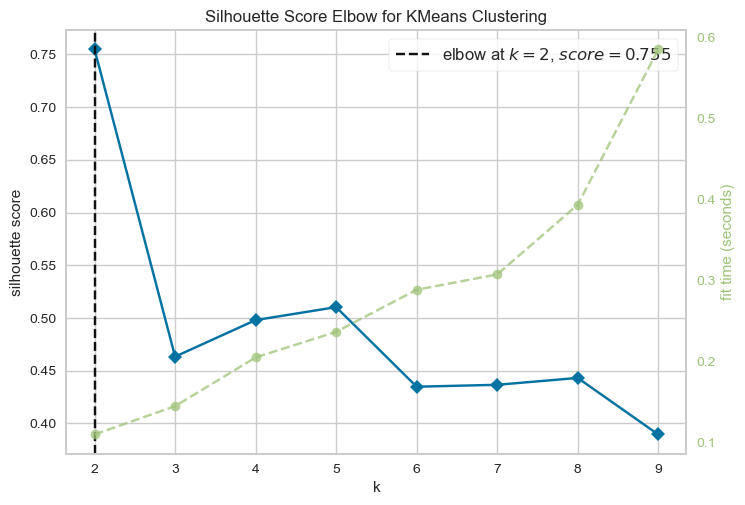

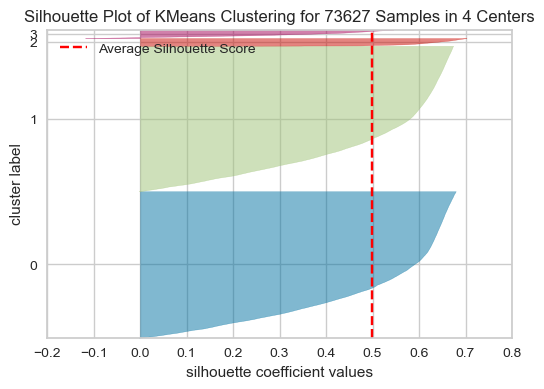

Silhouette score : 0.498


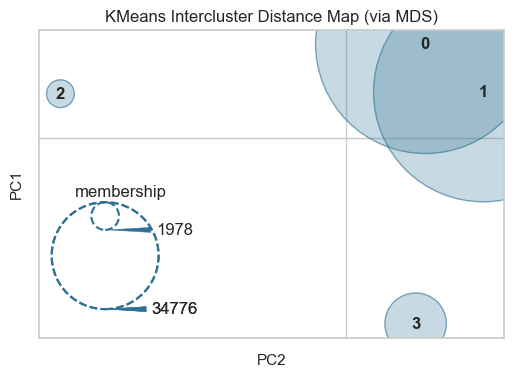

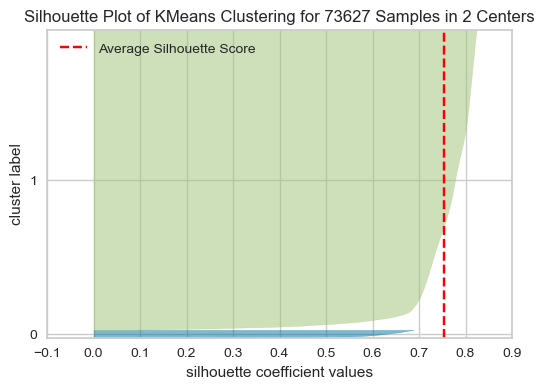

Silhouette score : 0.755


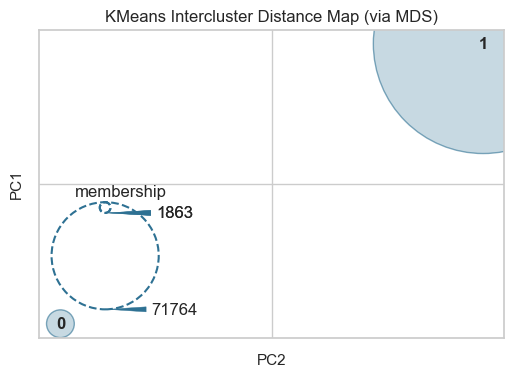

In [55]:
k_rfm_sum = km(rfm_sum, 2, 10)

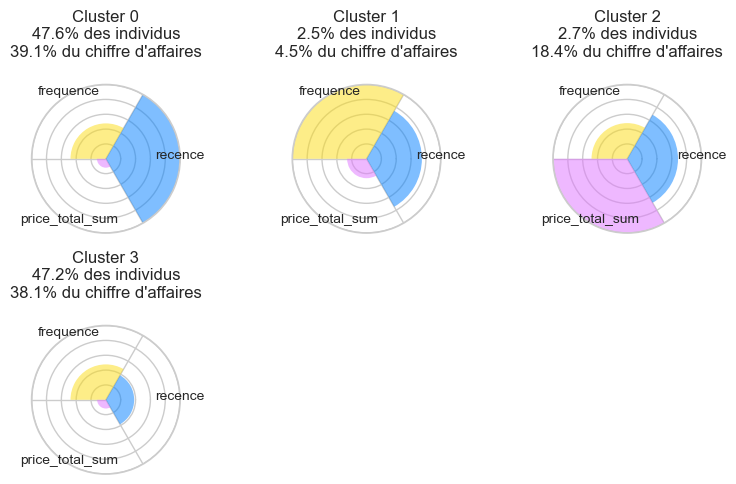

In [56]:
rfm_sum_cls, rfm_sum_cls_centers = clust(rfm_sum, k_rfm_sum)

RFM avec somme des montants commandés :  

|Cluster|% de clients|% de CA|Type de clients|
|:---|:---:|:---:|:---|
|0|47,6 %|39,1 %|Nouveaux clients|
|3|47,2 %|38,1 %|Clients inactifs, pas de commande récente, une seule commande sur la dernière année, et montant du panier faible|
|1| 2,5 %| 4,5 %|Clients réguliers, montant total des paniers plutôt faibles|  
|2| 2,7 %|18,4 %|Très bons clients sur le montant total des paniers, recence moyenne, une seule commande|



RFM avec moyenne des montants des paniers commandés :  

|Cluster|% de clients|% de CA|Type de clients|
|:---|:---:|:---:|:---|
|0|47,4 %|38,5 %|Nouveaux clients|
|1|47,1 %|37,6 %|Clients inactifs, pas de commande récente, une seule commande sur la dernière année, et montant du panier faible|
|2| 2,5 %| 4,7 %|Clients réguliers, montant moyen du panier faible|
|3| 2,9 %|19,2 %|Très bons clients sur le montant des paniers, récence moyenne|


Les 2 méthodes donnent des résultats très proches. Pour la suite nous garderons le RFM avec le panier moyen.

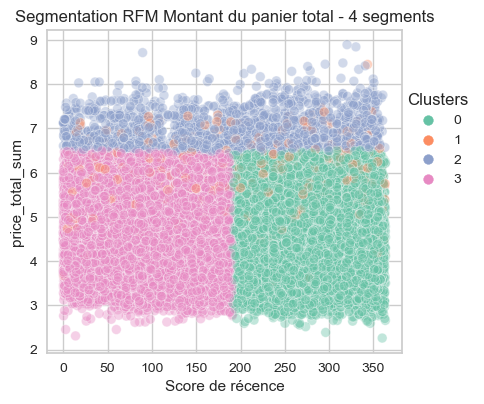

In [57]:
fig = plt.figure(figsize=(5, 4))

sns.scatterplot(x=rfm_sum_cls['recence'], y=np.log(
    rfm_sum_cls['price_total_sum']), hue=rfm_sum_cls['cluster'], alpha=0.4, palette='Set2')
plt.xlabel('Score de récence')
plt.ylabel('price_total_sum')
plt.legend(loc=(1, 0.5), title='Clusters')
plt.tight_layout()
plt.title("Segmentation RFM Montant du panier total - 4 segments")
plt.show()

In [58]:
# Création du DataFrame de segmentation
segment = rfm_mean_cls.copy()
segment['RFM'] = np.where(segment['cluster'] == 0, 'new', np.where(
    segment['cluster'] == 1, 'idle', np.where(segment['cluster'] == 2, 'regular', 'excellent')))
segment.drop(['recence', 'frequence', 'price_total_mean', 'cluster'],
             axis=1, inplace=True)
segment.tail(6)

,RFM
customer_unique_id,
fffa431dd3fcdefea4b1777d114144f2,idle
fffb09418989a0dbff854a28163e47c6,idle
fffbf87b7a1a6fa8b03f081c5f51a201,idle
fffcc512b7dfecaffd80f13614af1d16,excellent
fffea47cd6d3cc0a88bd621562a9d061,idle
ffff5962728ec6157033ef9805bacc48,new


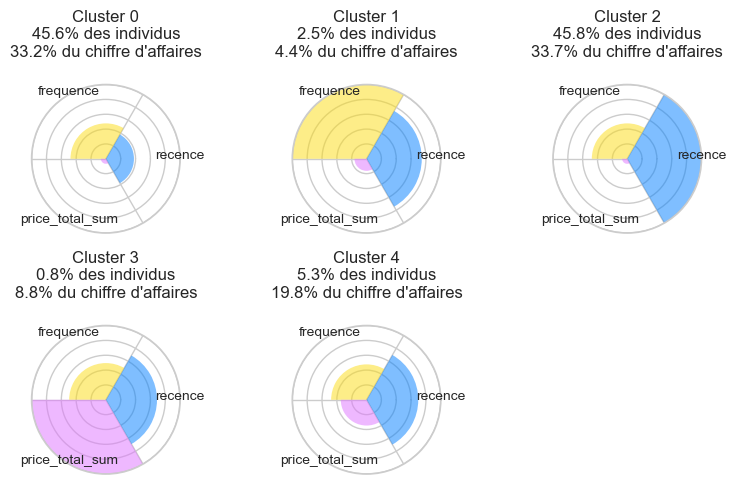

In [59]:
rfm_sum_cls, rfm_sum_cls_centers = clust(rfm_sum, 5)

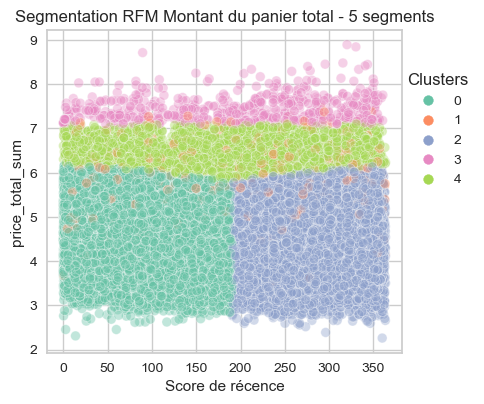

In [60]:
fig = plt.figure(figsize=(5, 4))

sns.scatterplot(x=rfm_sum_cls['recence'], y=np.log(
    rfm_sum_cls['price_total_sum']), hue=rfm_sum_cls['cluster'], alpha=0.4, palette='Set2')
plt.xlabel('Score de récence')
plt.ylabel('price_total_sum')
plt.legend(loc=(1, 0.5), title='Clusters')
plt.tight_layout()
plt.title("Segmentation RFM Montant du panier total - 5 segments")
plt.show()

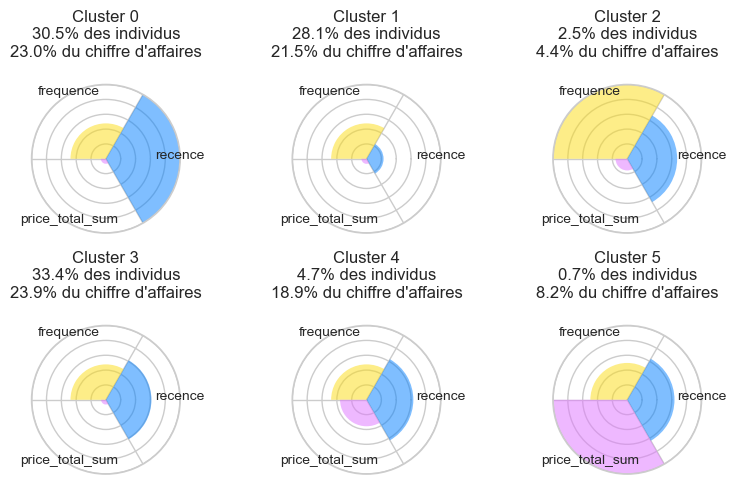

In [61]:
rfm_sum_cls, rfm_sum_cls_centers = clust(rfm_sum, 6)

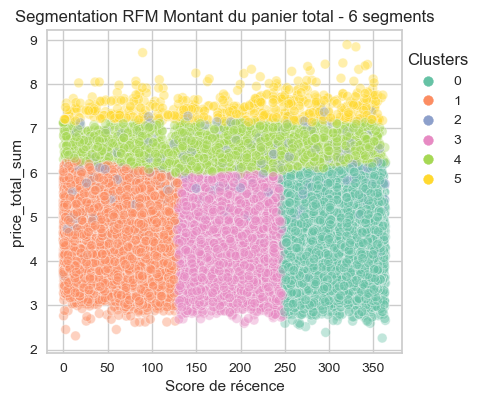

In [62]:
fig = plt.figure(figsize=(5, 4))

sns.scatterplot(x=rfm_sum_cls['recence'], y=np.log(
    rfm_sum_cls['price_total_sum']), hue=rfm_sum_cls['cluster'], alpha=0.4, palette='Set2')
plt.xlabel('Score de récence')
plt.ylabel('price_total_sum')
plt.legend(loc=(1, 0.5), title='Clusters')
plt.tight_layout()
plt.title("Segmentation RFM Montant du panier total - 6 segments")
plt.show()

## RFM + 

In [63]:
rfm_plus.head(2)

,recence,frequence,price_total_mean,payment_installments,payment_type_voucher
customer_unique_id,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,252.462674,1,141.90,1.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,249.764363,1,27.19,0.0,0.0


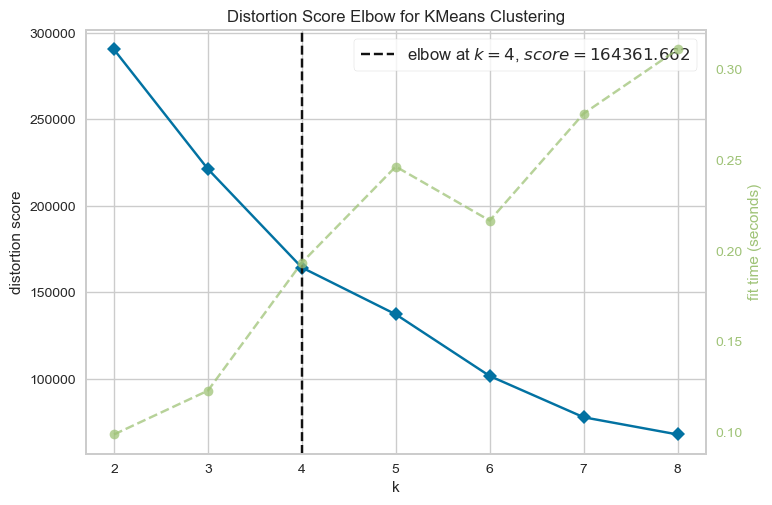

/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/yellowbrick/utils/kneed.py:156: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/yellowbrick/cluster/elbow.py:374: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


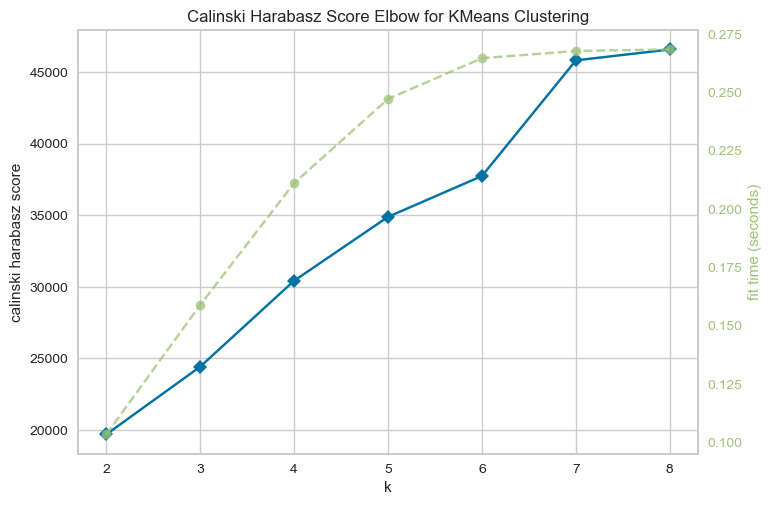

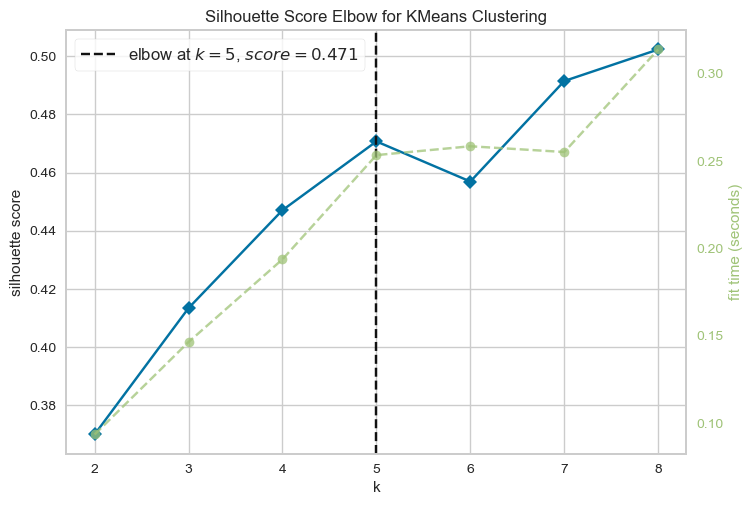

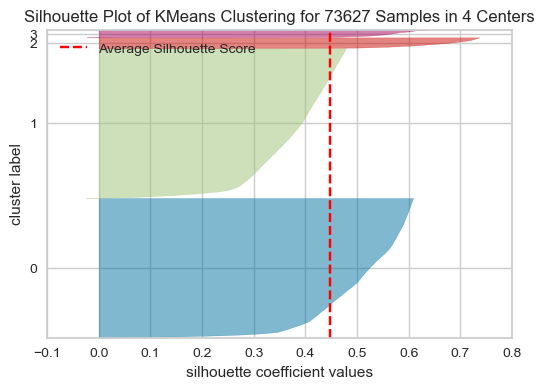

Silhouette score : 0.447


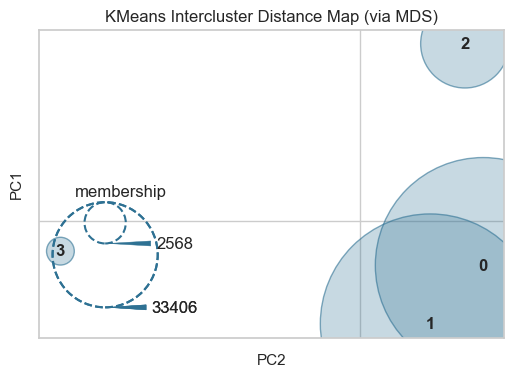

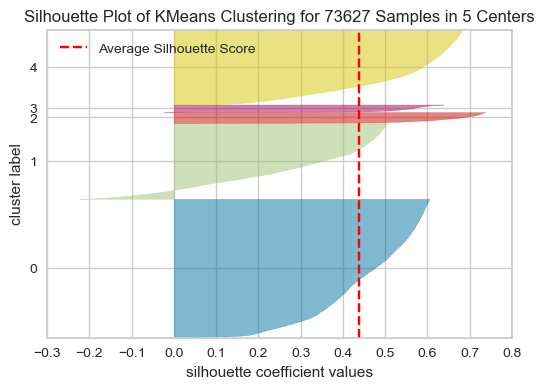

Silhouette score : 0.439


/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:512: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


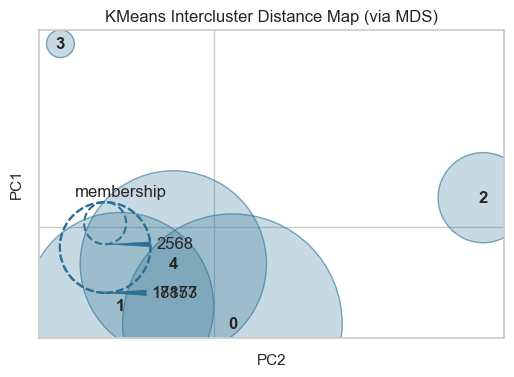

In [64]:
k_rfm_plus = km(rfm_plus, 2, 9)

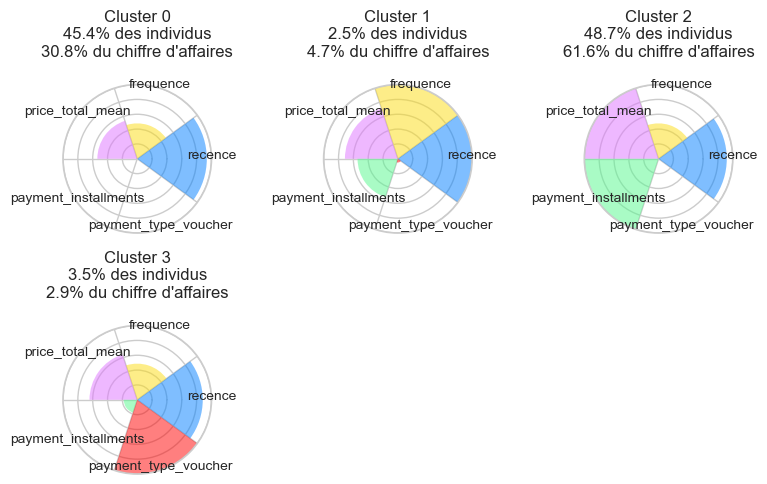

In [65]:
rfm_plus_cls, rfm_plus_cls_centers = clust(rfm_plus, k_rfm_plus)

La récence ne semble rien apporter. On va donc la supprimer et refaire la clusterisation.

In [66]:
rfm_plus_new = rfm_plus.copy()
rfm_plus_new.drop(columns='recence', inplace=True)

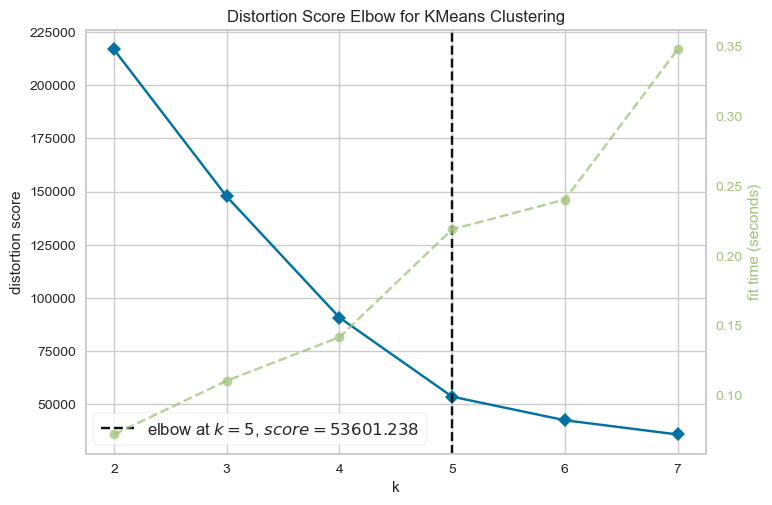

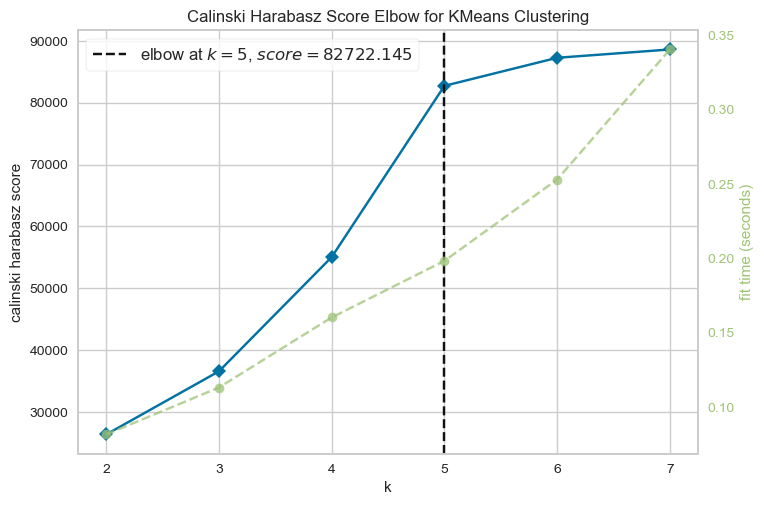

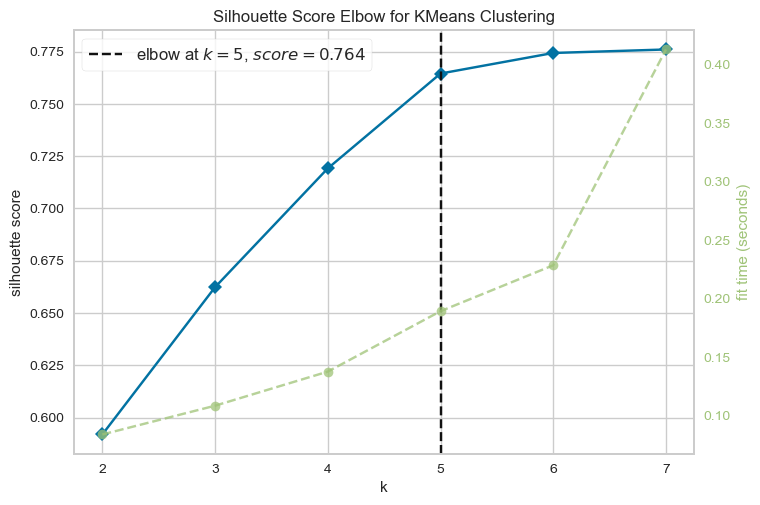

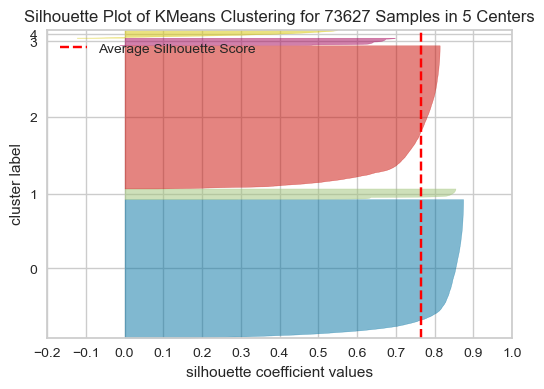

Silhouette score : 0.764


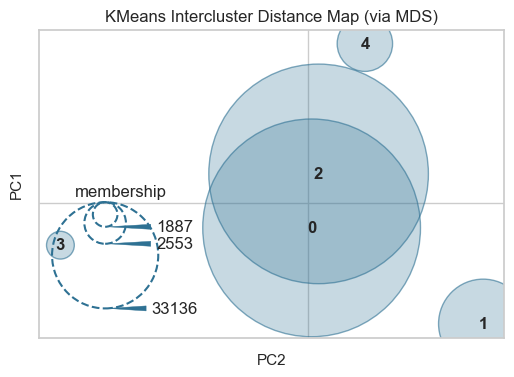

In [67]:
k_rfm_plus_new = km(rfm_plus_new, 2, 8)

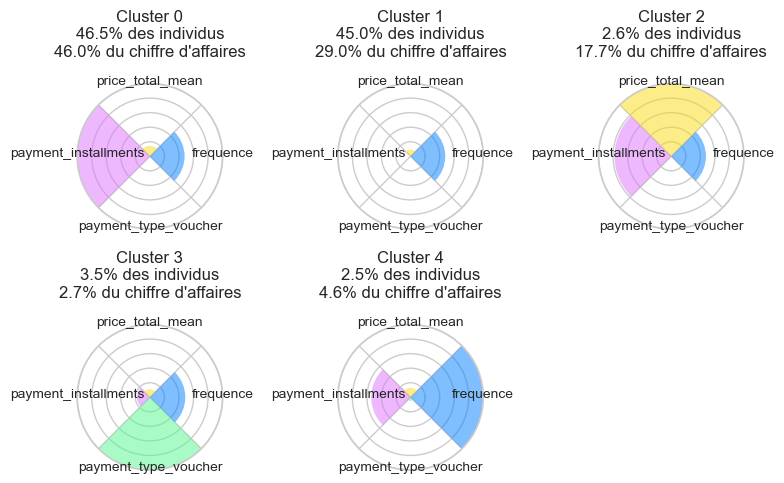

In [68]:
rfm_plus_new_cls, rfm_plus_new_cls_centers = clust(
    rfm_plus_new, 5, scale='standard')

|Cluster|% de clients|% de CA|Type de clients|
|:---|:---:|:---:|:---|
|0| 3,6 %| 2,9 %|Mauvais clients, sensibles aux bons d'achat et réductions, peu fréquents, montant moyen du panier faible|
|1|44,8 %|28,6 %|Mauvais clients, montants des paniers faibles et fréquence basse. Ils n'ont pas bénéficié d'étalements de paiement ni de vouchers|
|2|46,1 %|45,4 %|Mauvais clients, sensibles aux étalements de paiements, montant des paniers faibles, fréquence basse|
|3| 3,0 %| 5,6 %|Bons clients, réguliers, montant du panier moyen faible, moyennement sensibles aux étalements de paiement|
|4| 2,5 %|17,5 %|Très bons clients, montant moyen des paniers élevés, peu fréquents, assez sensibles aux étalements de paiement|
  
  
La variable 'price_total_mean' devrait peut-être être passée en log. On voit que sur les clusters 0 à 3 il y a des nuances, mais très peu visibles.

In [69]:
rfm_plus_log = rfm_plus_new.copy()
rfm_plus_log['price_total_mean'] = np.log(rfm_plus_log['price_total_mean'])

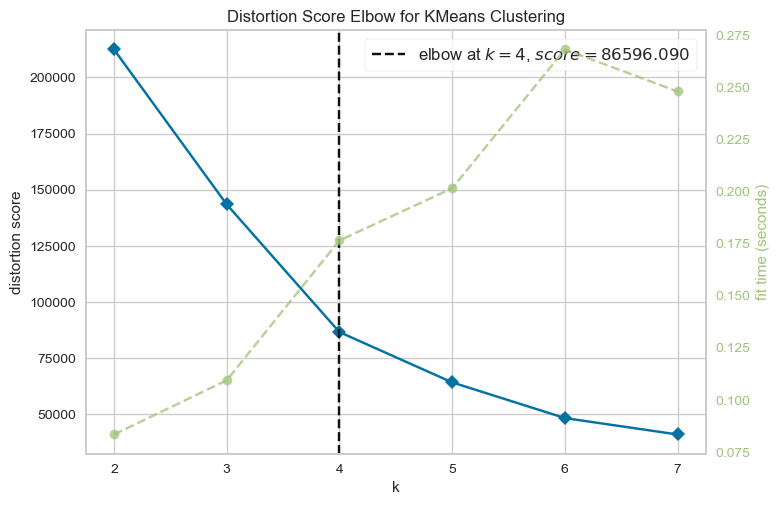

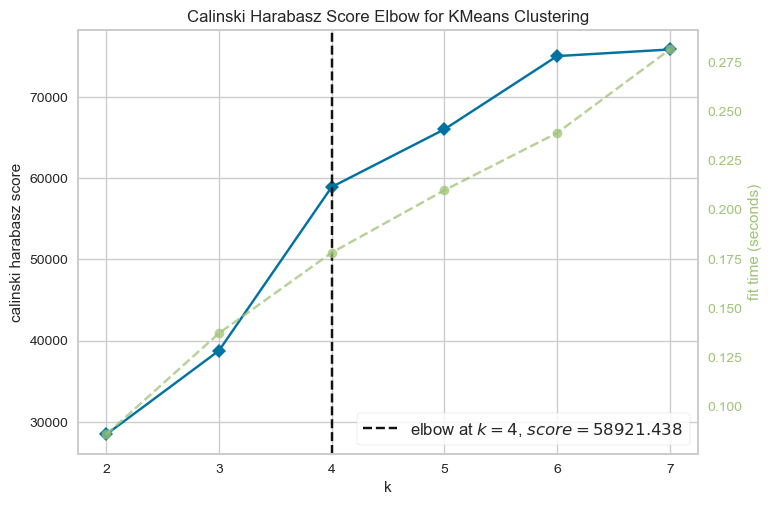

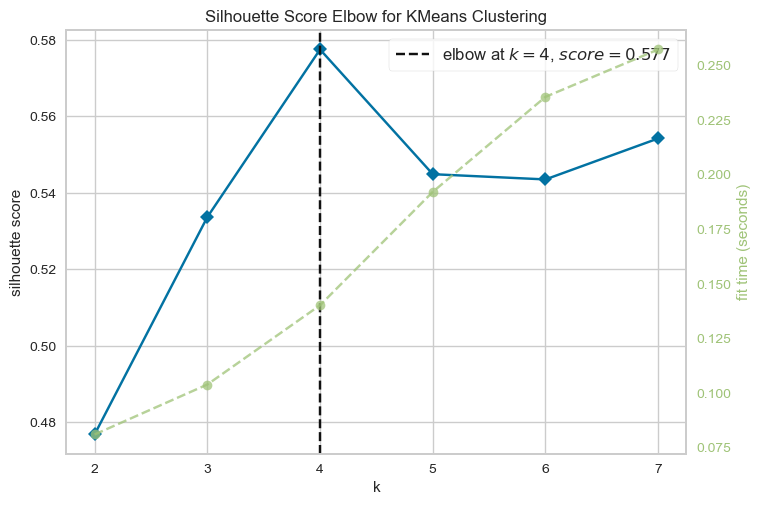

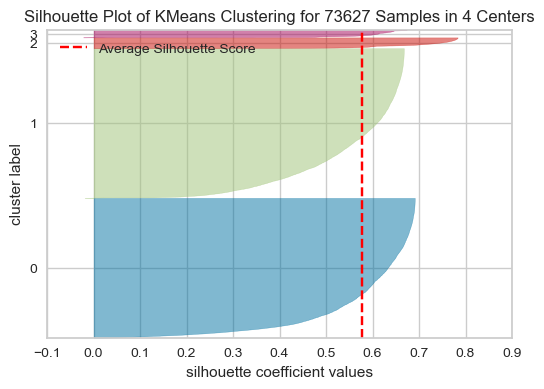

Silhouette score : 0.577


/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:512: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


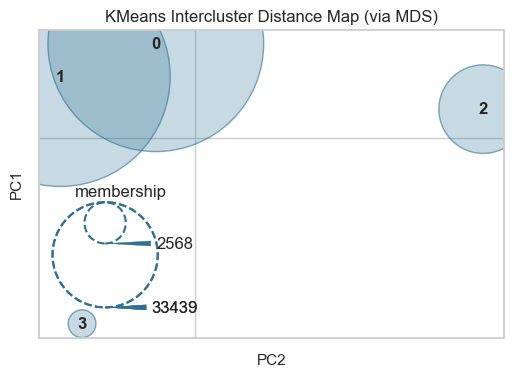

In [70]:
k_rfm_plus_log = km(rfm_plus_log, 2, 8)

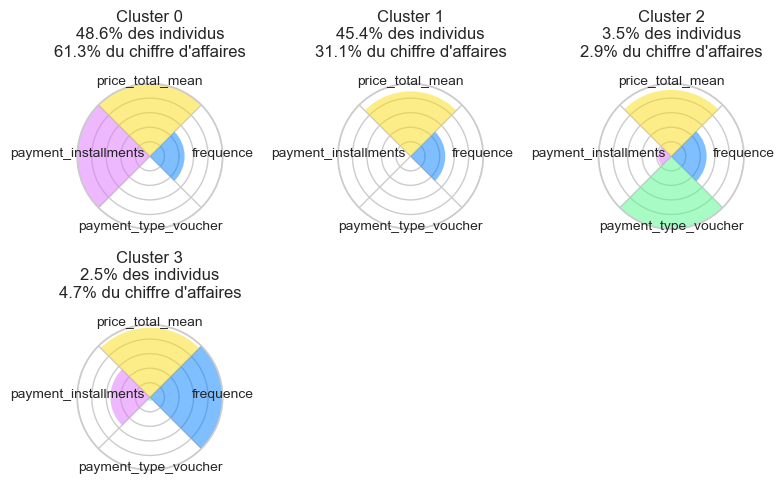

In [71]:
rfm_plus_log_cls, rfm_plus_log_cls_centers = clust(
    rfm_plus_log, k_rfm_plus_log, scale='standard')

La transformation log de price_total_mean ne nous aide pas du tout pour la lecture des différents segments.

J'ai un affreux doute sur le terme "voucher". Je n'arrive pas à comprendre s'il s'agit de bon d'achat (donc de réduction) ou simplement d'un chèque. Dans le doute, je n'utiliserai pas cette segmentation qui n'a aucun sens s'il s'agit de chèque bancaire.

## Douleurs clients

In [72]:
happy.head(2)

,delivery_delay,review_score_mean,delivery_time,review_message_lenght,canceled
customer_unique_id,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.0,5.0,6.411227,111.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,4.0,3.285590,0.0,0.0


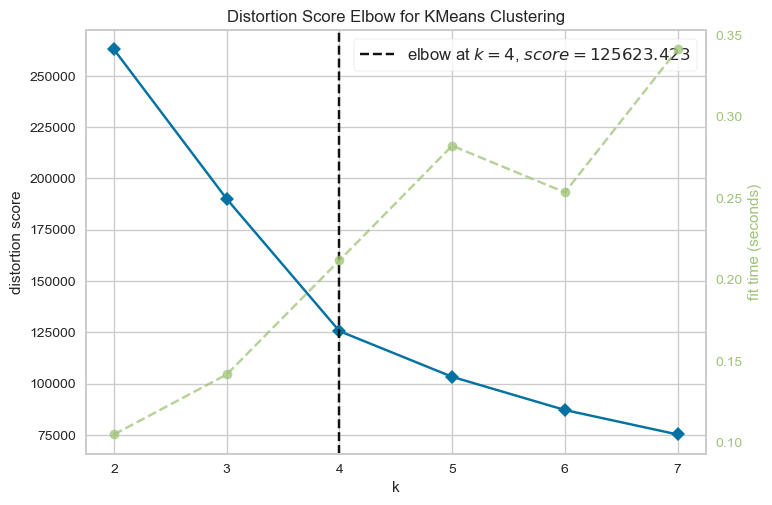

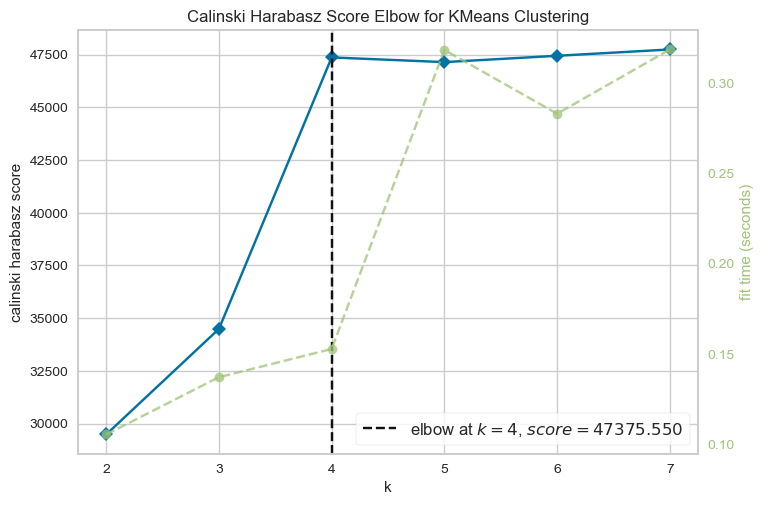

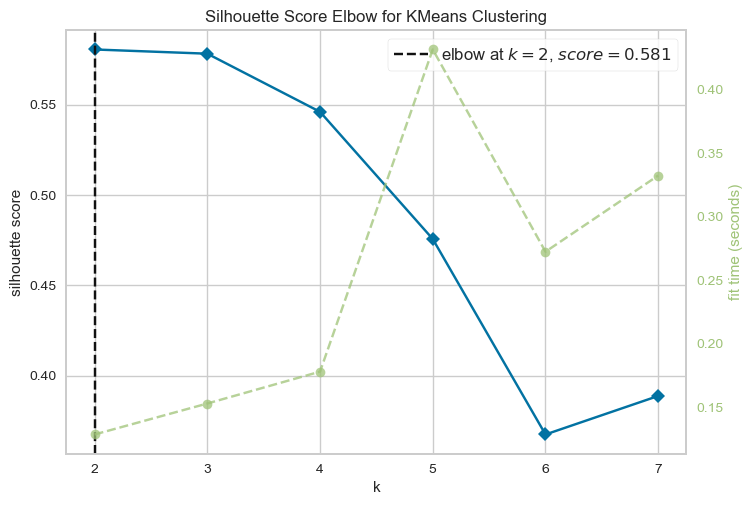

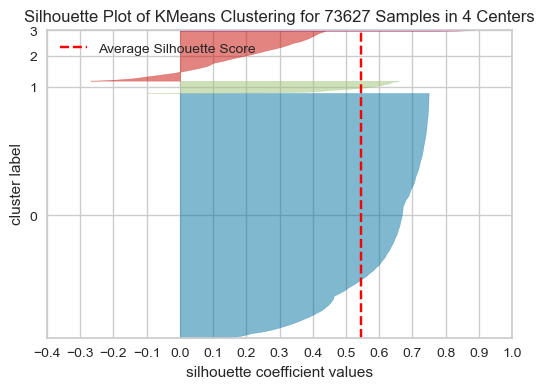

Silhouette score : 0.546


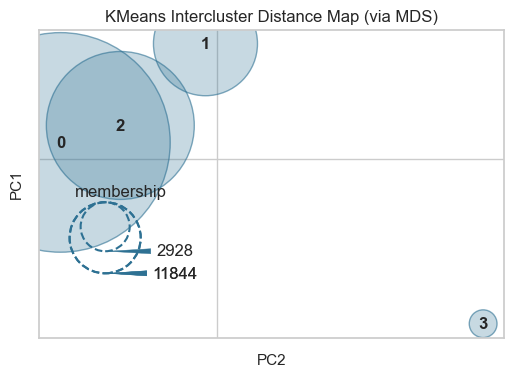

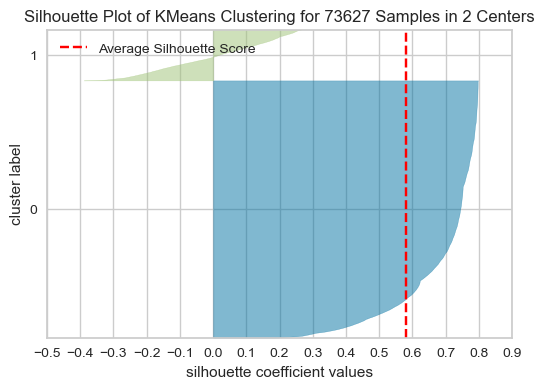

Silhouette score : 0.581


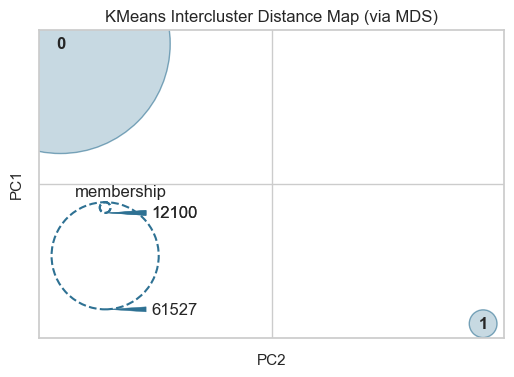

In [73]:
k_happy = km(happy, 2, 8)

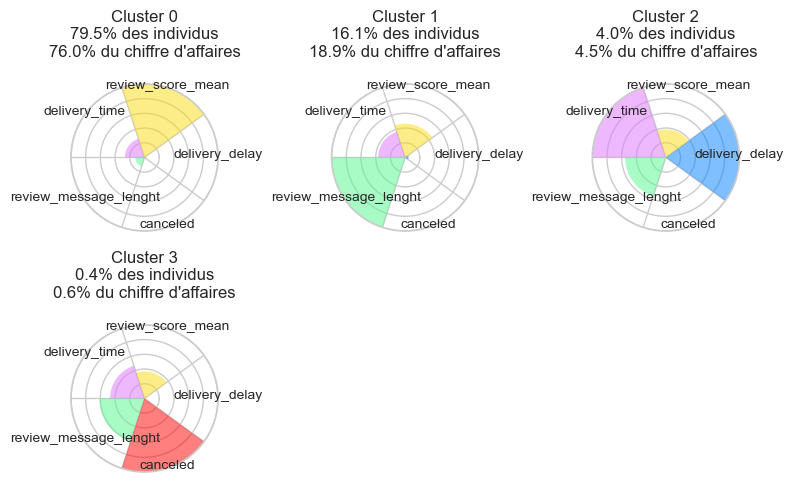

In [74]:
happy_cls, happy_cls_centers = clust(happy, k_happy)

|Cluster|% de clients|% de CA|Type de clients|
|:---|:---:|:---:|:---|
|0|79,5 %|76,0 %|Clients très satisfaits|
|1|16,1 %|18,9 %|Clients globalement peu satisfaits des produits, ayant laissé de longs commentaires avec la note, clients qui ont des choses à dire et veulent s'exprimer|
|2| 4,0 %| 4,5 %|Clients très insatisfaits à cause de longs délais de livraison et de gros retards|
|3| 0,4 %| 0,6 %|Clients très insatisfaits, ayant annulé leur commande ou ayant vu leur commande anulée pour indisponibilité des produits|

In [75]:
happy_cls

,delivery_delay,review_score_mean,delivery_time,review_message_lenght,canceled,cluster
customer_unique_id,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.0,5.0,6.411227,111.0,0.0,0
0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,4.0,3.285590,0.0,0.0,0
0000f6ccb0745a6a4b88665a16c9f078,0.0,4.0,20.037083,12.0,0.0,0
0004aac84e0df4da2b147fca70cf8255,0.0,5.0,13.141134,0.0,0.0,0
0004bd2a26a76fe21f786e4fbd80607f,0.0,4.0,1.860729,0.0,0.0,0
...,...,...,...,...,...,...
fffb09418989a0dbff854a28163e47c6,0.0,5.0,8.911563,0.0,0.0,0
fffbf87b7a1a6fa8b03f081c5f51a201,0.0,5.0,18.876759,0.0,0.0,0
fffcc512b7dfecaffd80f13614af1d16,0.0,1.0,27.976019,0.0,0.0,1


In [76]:
# Mise à jour du DataFrame de segmentation
segment['happyness'] = np.where(happy_cls['cluster'] == 0, 'happy', np.where(
    happy_cls['cluster'] == 1, 'unhappy_about_products', np.where(happy_cls['cluster'] == 2, 'unhappy_about_delay', 'unhappy_no_product')))
segment

,RFM,happyness
customer_unique_id,,
0000366f3b9a7992bf8c76cfdf3221e2,new,happy
0000b849f77a49e4a4ce2b2a4ca5be3f,new,happy
0000f6ccb0745a6a4b88665a16c9f078,idle,happy
0004aac84e0df4da2b147fca70cf8255,idle,happy
0004bd2a26a76fe21f786e4fbd80607f,new,happy
...,...,...
fffb09418989a0dbff854a28163e47c6,idle,happy
fffbf87b7a1a6fa8b03f081c5f51a201,idle,happy
fffcc512b7dfecaffd80f13614af1d16,excellent,unhappy_about_products


## Type d'achat

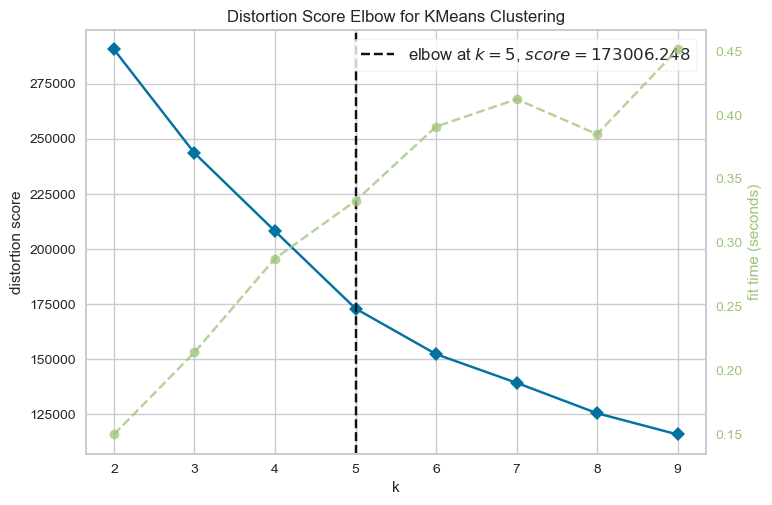

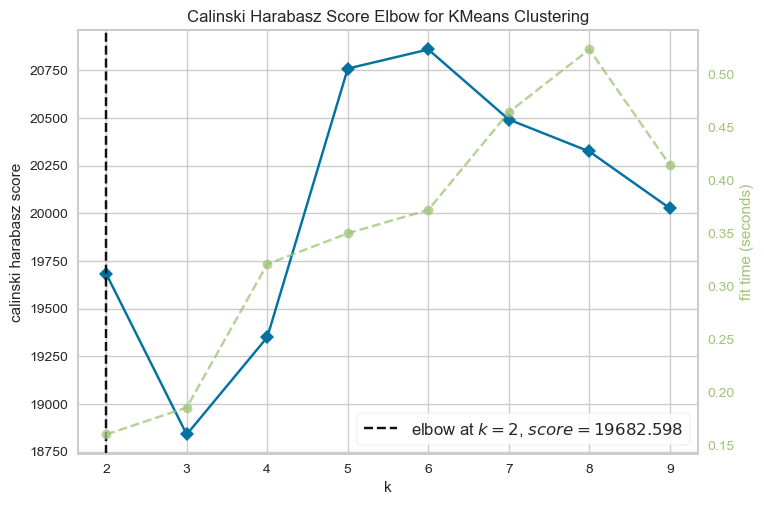

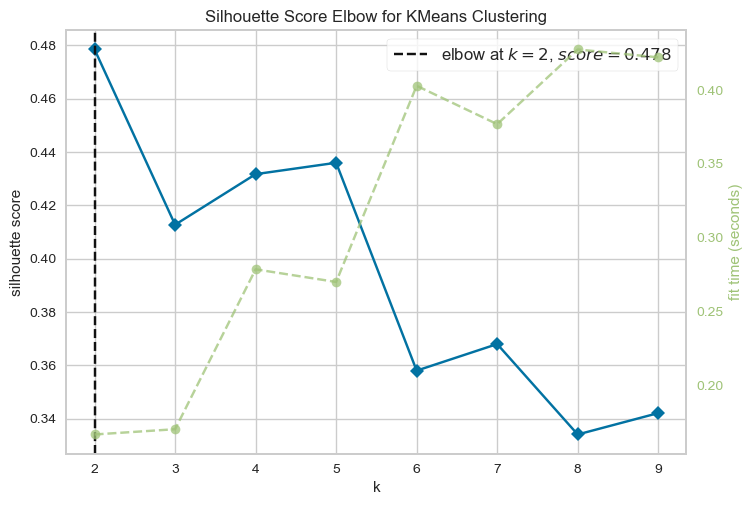

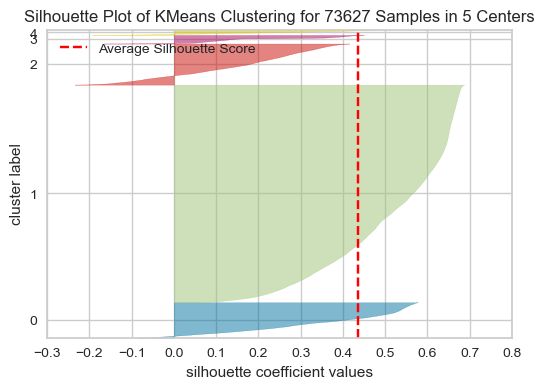

Silhouette score : 0.436


/Users/elisepoupinet/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:512: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


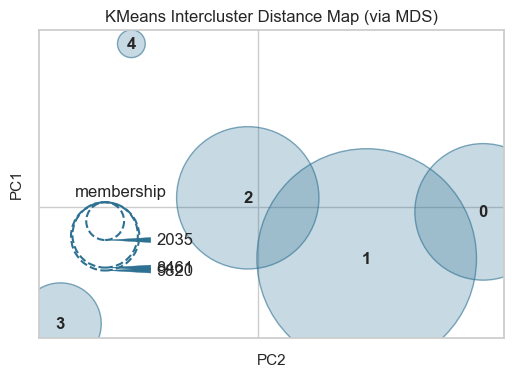

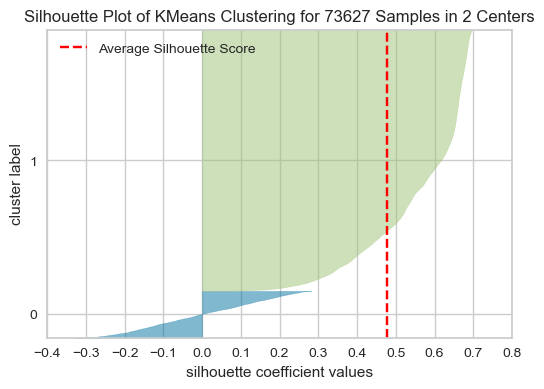

Silhouette score : 0.478


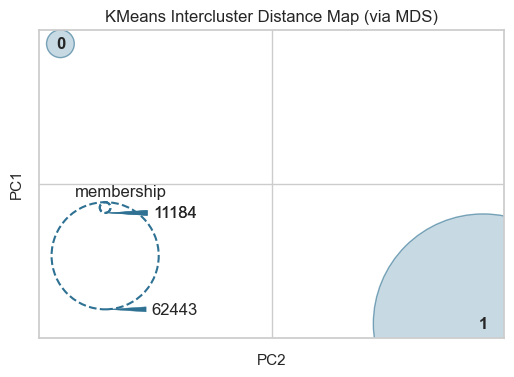

In [77]:
k_achat = km(achat, 2, 10)

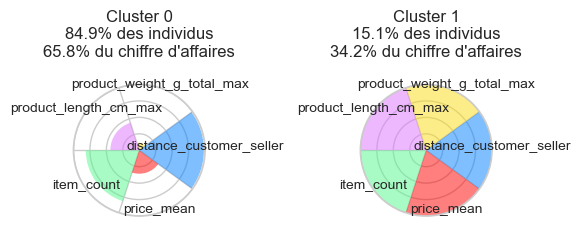

In [78]:
achat_cls, achat_cls_centers = clust(achat, k_achat)

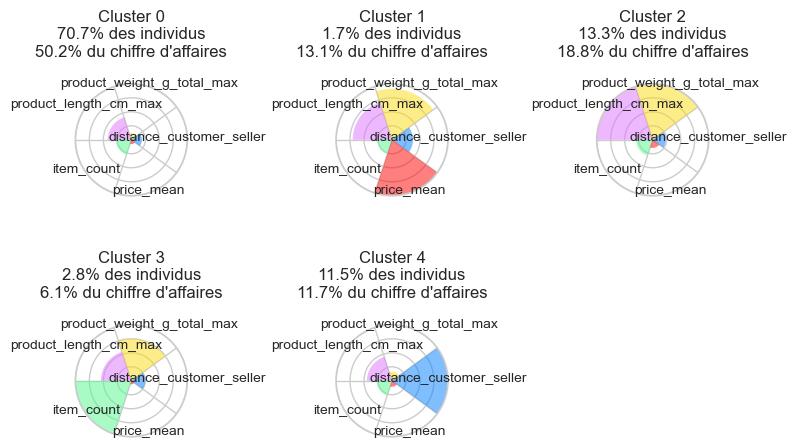

In [79]:
achat_cls, achat_cls_centers = clust(achat, 5)

|Cluster|% de clients|% de CA|Type de clients|
|:---|:---:|:---:|:---|
|0|70,7 %|50,2 %|Clients sans critère particulier quant à la livraison|
|1| 1,7 %|13,1 %|Clients se faisant livrer des articles lourds et à un prix élevé (hors port ici), donc sensibles à l'aspect pratique qu'offre une livraison pour ne pas avoir à porter des articles lourds et de qualité, qu'il ne faut donc pas abîmer pendant le transport|
|2|13,3 %|18,8 %|Clients ayant commandés un article encombrant et plutôt lourd, mais à un prix bas, donc sensibles aux avantages qu'offre la livraison mais pas à n'importe quel prix|
|3| 2,8 %| 6,1 %|Clients ayant commandé de nombreux articles, plutôt lourds au total, à un prix bas, profiteraient de devoir faire un achat pour ajouter des articles et "ne pas se faire livrer pour rien"|
|4|11,5 %|11,7 %|Clients très éloignés des points de vente, donc sensibles à l'aspect pratique qu'offre une livraison pour ne pas avoir à faire le trajet|

In [80]:
# Mise à jour du DataFrame de segmentation
segment['usefull_delivery'] = np.where(achat_cls['cluster'] == 0, 'none', np.where(
    achat_cls['cluster'] == 1, 'heavy_expensive', np.where(achat_cls['cluster'] == 2, 'bulky_heavy_cheap', np.where(achat_cls['cluster'] == 3, 'many_products', 'long_distance'))))
segment

,RFM,happyness,usefull_delivery
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,new,happy,none
0000b849f77a49e4a4ce2b2a4ca5be3f,new,happy,none
0000f6ccb0745a6a4b88665a16c9f078,idle,happy,long_distance
0004aac84e0df4da2b147fca70cf8255,idle,happy,none
0004bd2a26a76fe21f786e4fbd80607f,new,happy,bulky_heavy_cheap
...,...,...,...
fffb09418989a0dbff854a28163e47c6,idle,happy,none
fffbf87b7a1a6fa8b03f081c5f51a201,idle,happy,long_distance
fffcc512b7dfecaffd80f13614af1d16,excellent,unhappy_about_products,none


## Type de produits

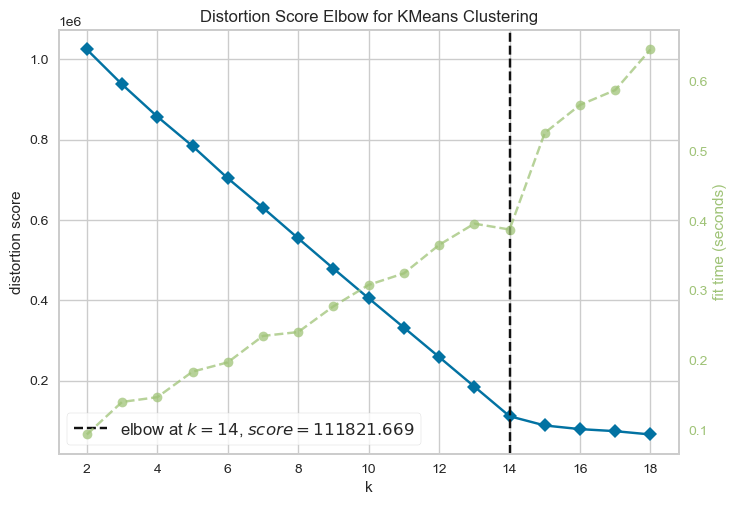

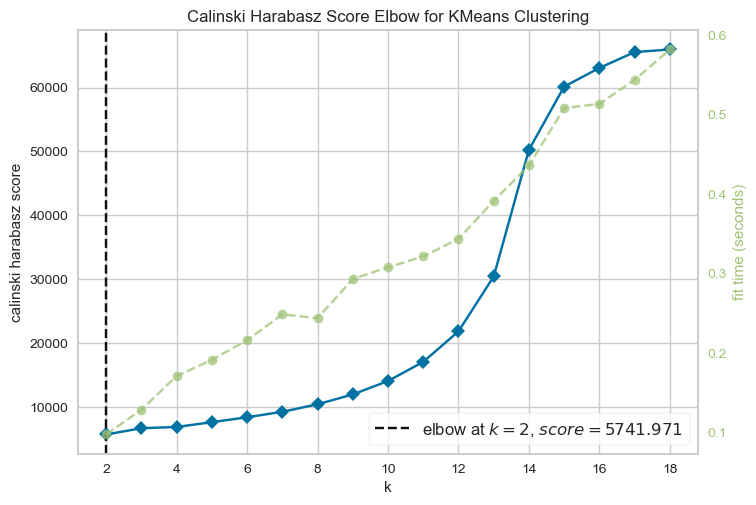

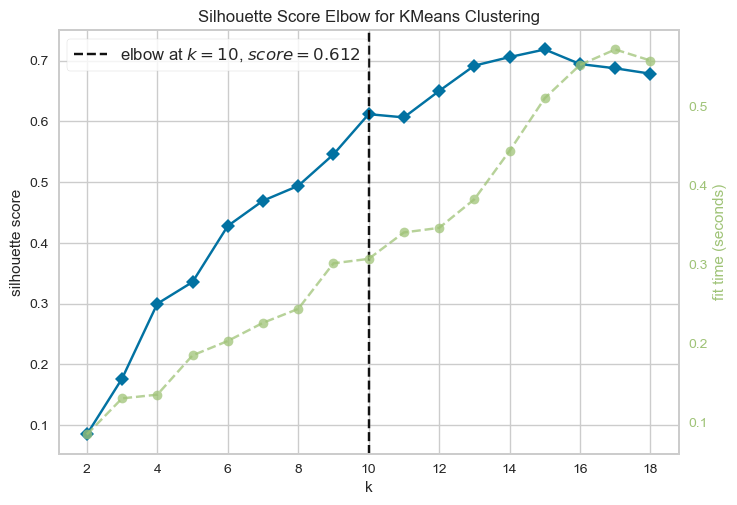

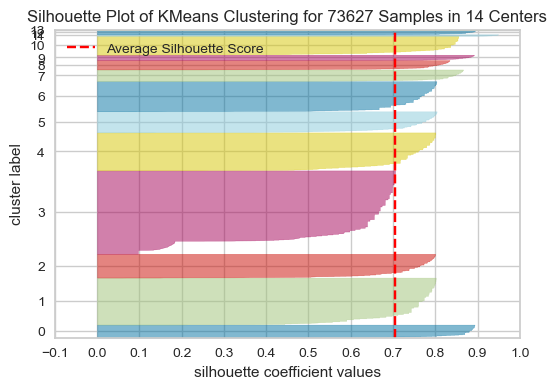

Silhouette score : 0.706


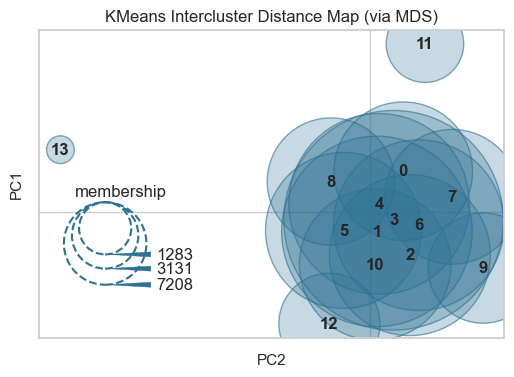

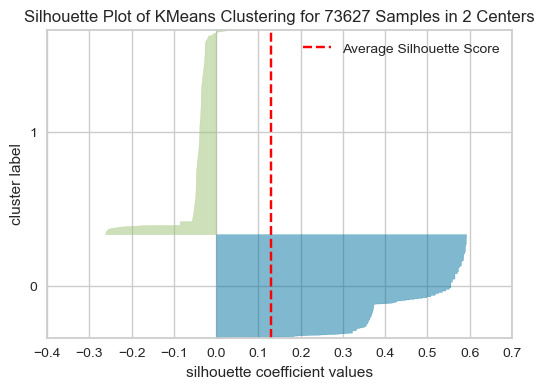

Silhouette score : 0.13


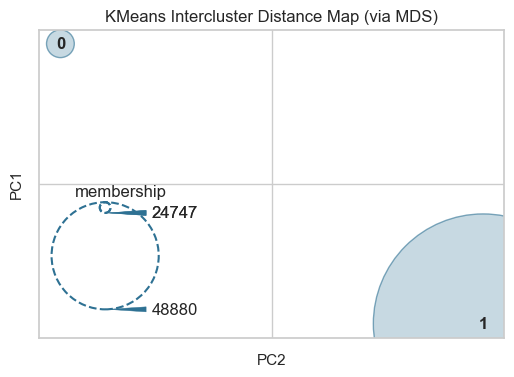

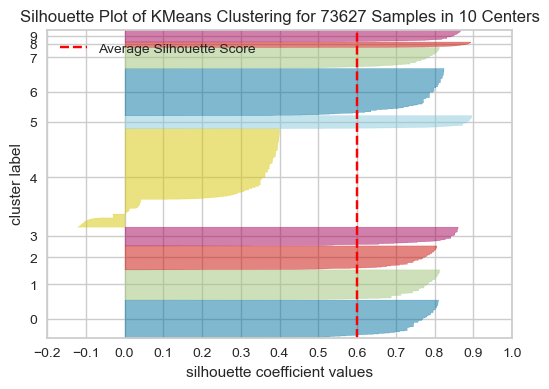

Silhouette score : 0.6


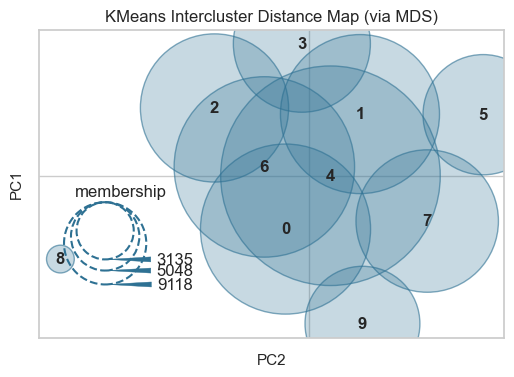

In [81]:
k_product = km(product, 2, 19)

/var/folders/tp/l9wv48rd5wx9r7_v76p641780000gn/T/ipykernel_32651/1098213976.py:73: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


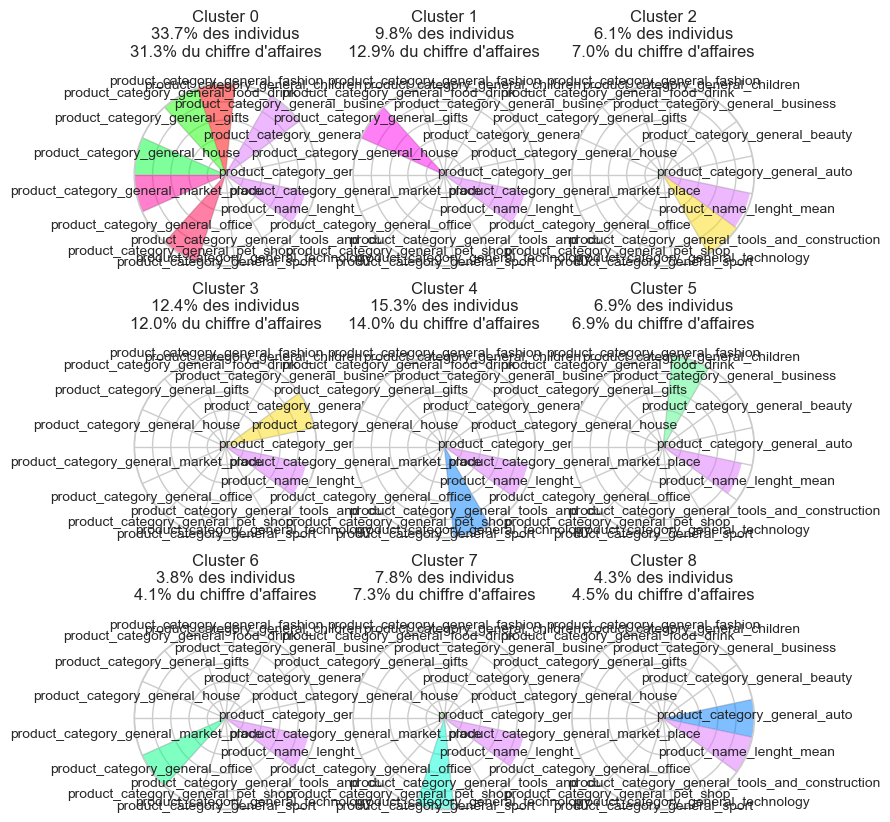

In [82]:
product_cls, product_cls_centers = clust(product, 9)

Je pensais que l'on aurait davantage de regroupements, par exemple children et house qui donneraient un cluster cocooning, mais rien de tout ça. Essayons avec un autre nombre de clusters, plus petit.

/var/folders/tp/l9wv48rd5wx9r7_v76p641780000gn/T/ipykernel_32651/1098213976.py:73: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout()


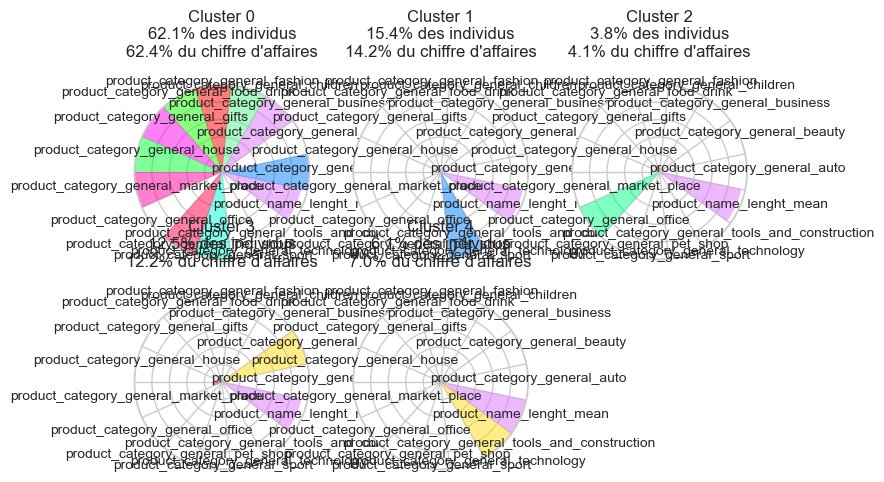

In [83]:
product_cls, product_cls_centers = clust(product, 5)

Ça ne fonctionne toujours pas, c'est tout ou rien. J'abandonne pour ce type de cluterisation.  
Je pense que cela vient du fait qu'il y a trop peu de commandes multiples dans le dataset.

# Exports

In [84]:
segment.to_csv('./data/final/segmentation.csv')